# Install Packages

In [ ]:
# !pip install --force-reinstall numpy==1.26.4

In [1]:
!pip install mogptk diffrax pykoopman pydmd

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.0/35.0 MB 60.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.5/58.5 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 219.1 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 136.5/136.5 kB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.5/129.5 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.2/193.2 kB 18.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.7/95.7 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.1/81.1 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.1/177.1 kB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 17.2 MB/s eta 0:00:00
  

# Import Libraries

In [ ]:
# System Packages
import os
import time

# Data manipulation
import numpy as np
import pandas as pd

# Plotting
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# For Bayesian Inference
import arviz as az
import pymc as pm
import pytensor
import pytensor.tensor as pt
from numba import njit
from pymc.ode import DifferentialEquation
from pytensor.compile.ops import as_op
from scipy.integrate import odeint, solve_ivp
from scipy.optimize import least_squares, curve_fit
from scipy.signal import detrend, savgol_filter

# MOGPTK
import torch
import mogptk

# NCDE
import diffrax
import equinox as eqx  # https://github.com/patrick-kidger/equinox
import jax
import jax.nn as jnn
import jax.numpy as jnp
import jax.random as jr
import jax.scipy as jsp
import optax  # https://github.com/deepmind/optax

# PyKoopman
import pykoopman as pk
from pydmd import DMD

# Performance metrics
from sklearn.metrics import r2_score
import networkx as nx

THEANO_FLAGS = "optimizer=fast_compile"

print(f"PyMC3 Version: {pm.__version__}")
print(f"NumPy Version: {np.__version__}")
print(f"PyTensor Version: {pytensor.__version__}")

PyMC3 Version: 5.22.0
NumPy Version: 1.26.0
PyTensor Version: 2.30.3


# Import Cyanobacteria KaiABC Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Load Data

Data is from https://www.nature.com/articles/ncomms8641#Sec22 Supplementary Table 2.

In [ ]:
thesis_path = "/content/drive/MyDrive/Grad_Stuff/Masters/Research Thesis/"
plots_path = os.path.join(thesis_path, "plots/")
plots_cyano_path = os.path.join(plots_path, "cyano/")
data_path = os.path.join(thesis_path, "data/")
dinner_path = os.path.join(data_path, "dinner/")

dinner_raw_df = pd.read_csv(os.path.join(dinner_path, "dinner_dataset_raw.csv"))
dinner_kaic_df = pd.read_csv(os.path.join(dinner_path, "dinner_raw_kaic.csv"))

dinner_raw_df = dinner_raw_df.rename(columns={'Time (hours)':'time'})
dinner_kaic_df = dinner_kaic_df.rename(columns={'Time (hours)':'time'})

tt2 = dinner_raw_df[dinner_raw_df['time'].between(35, 100)].time.values# np.linspace(0, dinner_kaic_df.time.values[-1], dinner_raw_df.time.max() * 1000)

dinner_raw_df.head()

# dinner_df = dinner_df.rename(columns={'Time (hours)':'time'})

# dinner_df.head()

,time,KaiA-1,KaiA-2,KaiA-3,KaiA-4,KaiA-5,KaiA-6,KaiB-1,KaiB-2,KaiB-3,...,DNA-3,DNA-4,DNA-5,DNA-6,RpaA-1,RpaA-2,RpaA-3,RpaA-4,RpaA-5,RpaA-6
0,0.000000,28.4,27.3,70.7,69.8,58.7,69.6,39.6,45.7,43.3,...,60.7,62.2,86.0,85.0,21.146197,20.561985,22.073208,20.759571,28.464488,27.678978
1,0.250000,30.7,29.8,71.9,69.8,62.9,66.4,35.1,42.5,39.4,...,64.3,64.5,88.2,85.9,15.974362,15.493775,18.457062,17.797359,25.190342,24.408083
2,0.500000,31.7,30.5,71.5,72.3,67.8,75.5,35.6,41.4,38.4,...,65.4,66.8,91.7,88.8,14.550573,13.931459,16.415082,15.629328,22.326600,21.534167
3,0.750333,34.3,32.8,73.4,73.0,66.1,74.5,35.4,41.9,39.3,...,67.4,68.2,93.4,91.5,13.460537,12.607499,15.889514,15.260489,21.617955,21.613496
4,1.000333,34.0,32.9,75.7,74.2,71.2,74.5,36.0,42.9,39.8,...,68.4,71.1,94.5,91.4,11.786033,12.249667,15.360529,14.464682,21.325175,20.858192


## Peek at raw and kaic datasets

In [ ]:
dinner_raw_df.head()

,time,KaiA-1,KaiA-2,KaiA-3,KaiA-4,KaiA-5,KaiA-6,KaiB-1,KaiB-2,KaiB-3,...,DNA-3,DNA-4,DNA-5,DNA-6,RpaA-1,RpaA-2,RpaA-3,RpaA-4,RpaA-5,RpaA-6
0,0.000000,28.4,27.3,70.7,69.8,58.7,69.6,39.6,45.7,43.3,...,60.7,62.2,86.0,85.0,21.146197,20.561985,22.073208,20.759571,28.464488,27.678978
1,0.250000,30.7,29.8,71.9,69.8,62.9,66.4,35.1,42.5,39.4,...,64.3,64.5,88.2,85.9,15.974362,15.493775,18.457062,17.797359,25.190342,24.408083
2,0.500000,31.7,30.5,71.5,72.3,67.8,75.5,35.6,41.4,38.4,...,65.4,66.8,91.7,88.8,14.550573,13.931459,16.415082,15.629328,22.326600,21.534167
3,0.750333,34.3,32.8,73.4,73.0,66.1,74.5,35.4,41.9,39.3,...,67.4,68.2,93.4,91.5,13.460537,12.607499,15.889514,15.260489,21.617955,21.613496
4,1.000333,34.0,32.9,75.7,74.2,71.2,74.5,36.0,42.9,39.8,...,68.4,71.1,94.5,91.4,11.786033,12.249667,15.360529,14.464682,21.325175,20.858192


In [ ]:
dinner_kaic_df.head()

,time,KaiC~P-1,KaiC~P-2,KaiC~P-3,RpaA~P-1,RpaA~P-2,RpaA~P-3
0,0,62.561924,82.299511,81.757074,3.148162,0.000000,0.000000
1,4,81.960023,83.623841,85.203814,63.558363,69.427005,64.846660
2,8,66.670380,73.479307,75.186304,16.250787,30.959664,24.765778
3,12,57.927655,65.610557,65.629581,14.161622,27.147212,23.230185
4,16,52.613436,64.190218,65.650683,25.093121,36.979927,36.991364


<AxesSubplot:xlabel='time'>

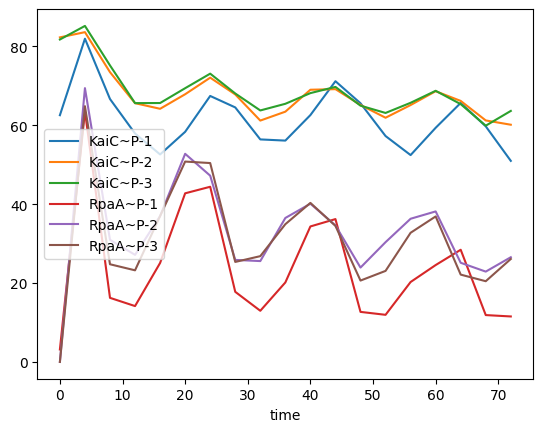

In [ ]:
dinner_kaic_df.plot(x = 'time')

## Transform Data

### Smoothen Raw Dataset

<AxesSubplot:xlabel='time'>

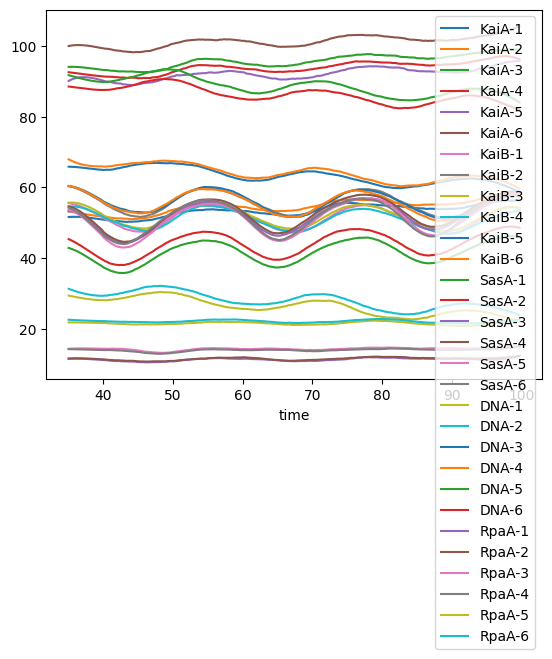

In [ ]:
dinner_raw_smooth = dinner_raw_df.copy()

dinner_raw_smooth = dinner_raw_smooth[dinner_raw_smooth['time'].between(35, 100)]

# dinner_raw_smooth = dinner_raw_smooth.iloc[::2, :]

window_length = 40
polyorder = 3

dinner_raw_smooth.iloc[:, 1:] = savgol_filter(x = dinner_raw_smooth.iloc[:, 1:].T,
                                          window_length = window_length,
                                          polyorder = polyorder).T

dinner_raw_smooth = np.trunc(dinner_raw_smooth * 1000) / 1000

dinner_raw_smooth = dinner_raw_smooth.dropna()
dinner_raw_smooth.time = dinner_raw_smooth.time.round(3)

tt2 = dinner_raw_smooth.time

dinner_raw_smooth.plot(x = 'time')

### Interpolate KaiC Dataset

In [ ]:
def fit_sin(tt, yy):
    '''Fit sin to the input time sequence, and return fitting parameters "amp", "omega", "phase", "offset", "freq", "period" and "fitfunc"'''
    tt = np.array(tt)
    yy = np.array(yy)
    ff = np.fft.fftfreq(len(tt), (tt[1]-tt[0]))   # assume uniform spacing
    Fyy = abs(np.fft.fft(yy))
    guess_freq = abs(ff[np.argmax(Fyy[1:])+1])   # excluding the zero frequency "peak", which is related to offset
    guess_amp = np.std(yy) * 2.**0.5
    guess_offset = np.mean(yy)
    guess_trend = (yy[-1] - yy[0])/(tt[-1] - tt[0])
    guess = np.array([guess_amp, 2.*np.pi*guess_freq, 0., guess_offset, guess_trend])

    def sinfunc(t, A, w, p, c, d):
      return A * np.sin(w*t + p) + c + d*t

    popt, pcov = curve_fit(sinfunc, tt, yy, p0=guess)
    A, w, p, c, d = popt
    f = w/(2.*np.pi)
    fitfunc = lambda t: A * np.sin(w*t + p) + c + d * t
    return {"amp": A, "omega": w, "phase": p, "offset": c, "trend": d, "freq": f, "period": 1./f, "fitfunc": fitfunc, "maxcov": np.max(pcov), "rawres": (guess,popt,pcov)}

<AxesSubplot:xlabel='time'>

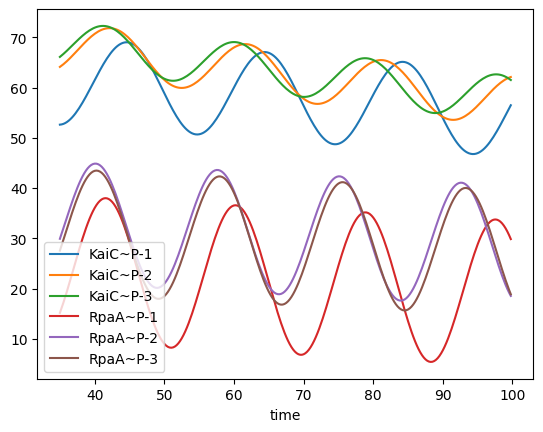

In [ ]:
dinner_kaic_smooth_dict = dict()

dinner_kaic_smooth_dict['time'] = tt2

for col in dinner_kaic_df.columns[1:]:

  res = fit_sin(tt = dinner_kaic_df.time.values, yy = dinner_kaic_df[col].values)
  dinner_kaic_smooth_dict[col] = res["fitfunc"](tt2)

dinner_kaic_smooth = pd.DataFrame(dinner_kaic_smooth_dict)
dinner_kaic_smooth.time = dinner_kaic_smooth.time.round(3)
dinner_kaic_smooth.plot(x = 'time')

### Combine Raw Oscillators with KaiC Oscillators To Create Final Data

<AxesSubplot:xlabel='time'>

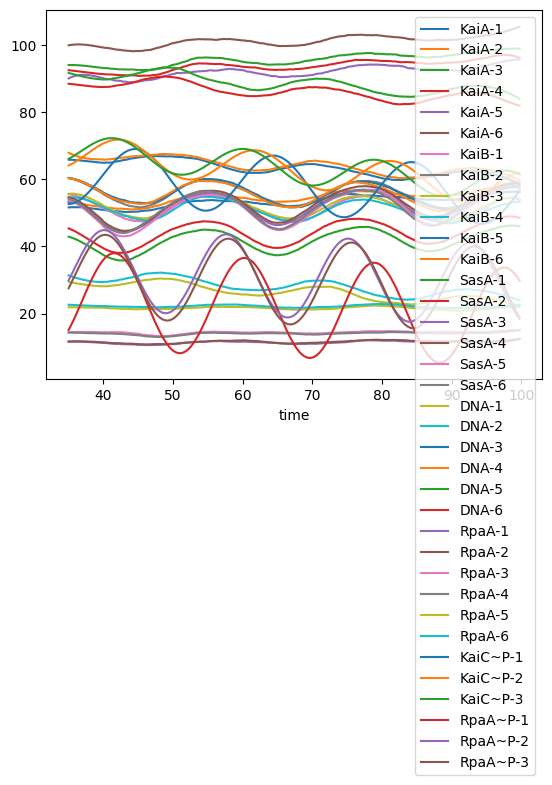

In [ ]:
dinner_smooth = pd.merge(dinner_raw_smooth, dinner_kaic_smooth, on = 'time', how='left')
dinner_smooth.plot(x = 'time')

## Select one of each protein instead of all duplicates included

In [ ]:
dinner_smooth = dinner_smooth[['time', 'KaiA-1', 'KaiB-1', 'KaiC~P-1', 'SasA-1', 'DNA-1', 'RpaA-1',  'RpaA~P-1']]
dinner_smooth.columns = ['time', 'KaiA', 'KaiB', 'KaiC-P', 'SasA', 'DNA', 'RpaA', 'RpaA-P']

<ipython-input-15-75aec5303b3e>:7: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, "cyano_original_data.png"), bbox_extra_artists=(lgd))
<ipython-input-15-75aec5303b3e>:7: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, "cyano_original_data.png"), bbox_extra_artists=(lgd))
<ipython-input-15-75aec5303b3e>:7: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, "cyano_original_data.png"), bbox_extra_artists=(lgd))
<ipython-input-15-75aec5303b3e>:7: MatplotlibDeprecationWarning: savefig() go

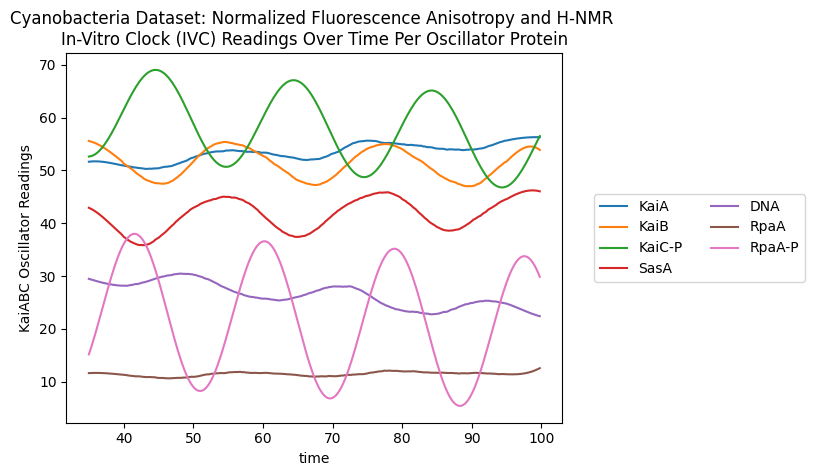

In [ ]:
dinner_smooth.plot(x = 'time')

plt.ylabel('KaiABC Oscillator Readings')
plt.title('Cyanobacteria Dataset: Normalized Fluorescence Anisotropy and H-NMR '+\
          '\nIn-Vitro Clock (IVC) Readings Over Time Per Oscillator Protein')
lgd = plt.legend(bbox_to_anchor=(1.05, 0.5), ncol=2, loc='center left')
plt.savefig(os.path.join(plots_cyano_path, "cyano_original_data.png"), bbox_extra_artists=(lgd))

# Configs

In [ ]:
def regular_mse(pred_df, true_df):
  """
  pred_df: dataframe of predictions of shape (n_timepoints, n_genes)
  true_df: dataframe of true values of shape (n_timepoints, n_genes)
  """

  return np.mean((true_df - pred_df) ** 2)


def pooled_mse(pred_df, true_df):
  """
  pred_df: dataframe of predictions of shape (n_timepoints, n_genes)
  true_df: dataframe of true values of shape (n_timepoints, n_genes)
  """

  return np.mean(np.mean((pred_df - true_df) ** 2, axis = 0))



In [ ]:
G = nx.Graph()

G.add_edge('KaiA', 'KaiC-P', weight=1)
G.add_edge('KaiB', 'KaiC-P', weight=-1)
G.add_edge('KaiA', 'KaiB', weight=-1)
G.add_edge('SasA', 'RpaA', weight=1)
G.add_edge('RpaA', 'RpaA-P', weight=-1)
G.add_edge('RpaA-P', 'DNA', weight=1)
G.add_edge('KaiC-P', 'DNA', weight=1)
G.add_edge('KaiA', 'DNA', weight=1)
G.add_edge('KaiB', 'DNA', weight=1)


G.adjacency()

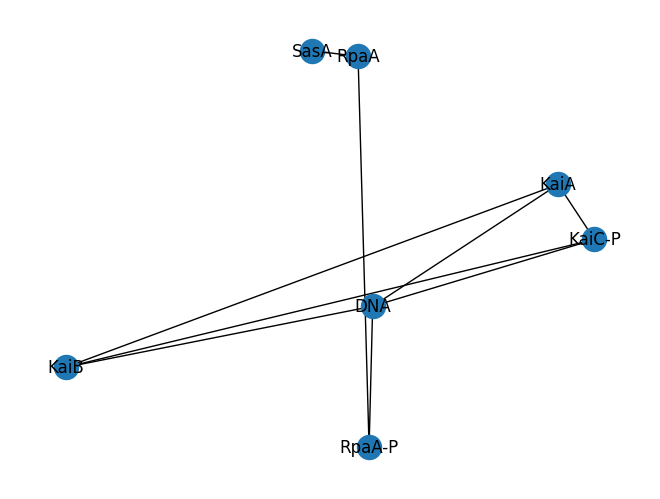

In [ ]:
nx.draw(G, with_labels = True)


In [ ]:
true_adjacency = nx.to_pandas_adjacency(G, nodelist = G.nodes())
true_adjacency = true_adjacency.loc[dinner_smooth.columns[1:],
                                    dinner_smooth.columns[1:]]
true_adjacency

,KaiA,KaiB,KaiC-P,SasA,DNA,RpaA,RpaA-P
KaiA,0.0,-1.0,1.0,0.0,1.0,0.0,0.0
KaiB,-1.0,0.0,-1.0,0.0,1.0,0.0,0.0
KaiC-P,1.0,-1.0,0.0,0.0,1.0,0.0,0.0
SasA,0.0,0.0,0.0,0.0,0.0,1.0,0.0
DNA,1.0,1.0,1.0,0.0,0.0,0.0,1.0
RpaA,0.0,0.0,0.0,1.0,0.0,0.0,-1.0
RpaA-P,0.0,0.0,0.0,0.0,1.0,-1.0,0.0


,KaiA,KaiB,KaiC-P,SasA,DNA,RpaA,RpaA-P
KaiA,1,1,1,1,-1,1,1
KaiB,1,1,1,1,-1,1,1
KaiC-P,1,1,1,1,-1,1,1
SasA,1,1,1,1,1,1,1
DNA,-1,-1,-1,1,1,-1,1
RpaA,1,1,1,1,-1,1,-1
RpaA-P,1,1,1,1,1,-1,1


In [ ]:
def binarize(x):
  if x > 0:
    return 1
  elif x < 0:
    return -1
  else:
    return 0

def compare_coupling(pred_df, true_df):
  """
  pred_df: dataframe of predictions of shape (n_timepoints, n_genes)
  true_df: dataframe of true values of shape (n_timepoints, n_genes)
  """
  binary_pred = pred_df.map(binarize)
  return np.linalg.norm(binary_pred - true_df)



In [ ]:
# # Define the node labels (same for rows/source and columns/target)
# nodes = ['KaiA', 'KaiB', 'KaiC-P', 'SasA', 'RpaA', 'RpaA-P', 'DNA']

# # Define the adjacency matrix data based on the previous interactions
# # Rows: Source of regulation
# # Columns: Target of regulation
# # 1: Activation, -1: Repression, 0: No direct regulation
# adj_data = np.array([
# #Tgt: KaiA, KaiB, KaiC-P, SasA, RpaA, RpaA-P, DNA
#     [  0,    0,     1,     0,    0,     0,     0 ], # Source: KaiA
#     [  0,    0,     0,     0,    0,     0,     0 ], # Source: KaiB
#     [ -1,    1,     0,     1,    0,     0,     0 ], # Source: KaiC-P
#     [  0,    0,     1,     0,    0,     1,     0 ], # Source: SasA
#     [  0,    0,     0,     0,    0,     -1,     0 ], # Source: RpaA
#     [  0,    0,     0,     0,    -1,     0,     1 ], # Source: RpaA-P
#     [  0,    0,     0,     0,    0,     0,     0 ]  # Source: DNA
# ])

# # Create the Pandas DataFrame
# adj_matrix_df = pd.DataFrame(adj_data, index=nodes, columns=nodes)
# adj_matrix_df = adj_matrix_df.loc[dinner_smooth.columns[1:],
#                                   dinner_smooth.columns[1:]]

# # Print the DataFrame
# print("Adjacency Matrix as Pandas DataFrame:")
# print(adj_matrix_df)

Adjacency Matrix as Pandas DataFrame:
        KaiA  KaiB  KaiC-P  SasA  DNA  RpaA  RpaA-P
KaiA       0     0       1     0    0     0       0
KaiB       0     0       0     0    0     0       0
KaiC-P    -1     1       0     1    0     0       0
SasA       0     0       0     0    0     0       1
DNA        0     0       0     0    0     0       0
RpaA       0     0       0     0    0     0       0
RpaA-P     0     0       0     0    1     0       0


In [ ]:
# Get colnames
clock_cols = dinner_smooth\
  .drop(['time'], axis = 1, inplace = False)\
  .columns.tolist()


In [ ]:
dinner_smooth.shape

(260, 8)

# MOGP

## MOGP Configs

In [ ]:
TRAIN_HIST = int(dinner_smooth.time.values[-1] * 0.8)
TRAIN_HIST

79

## MOGP Data Prep

In [ ]:
mogptk_data = mogptk.DataSet()

for i, clock_col in enumerate(clock_cols):
    mogptk_data.append(mogptk.Data(dinner_smooth['time'], dinner_smooth[clock_col], name = clock_col))
    mogptk_data.transform(mogptk.TransformDetrend(degree=1))
    mogptk_data[i].remove_range(start = TRAIN_HIST)
    # mogptk_data[i].remove_range(start = 0, end = 30)
    # mogptk_data[i] # remove frome nd

(<Figure size 1200x2800 with 7 Axes>,
 array([[<AxesSubplot:title={'center':'KaiA'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'KaiB'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'KaiC-P'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'SasA'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'DNA'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'RpaA'}, xlabel='X', ylabel='Y'>],
        [<AxesSubplot:title={'center':'RpaA-P'}, xlabel='X', ylabel='Y'>]],
       dtype=object))

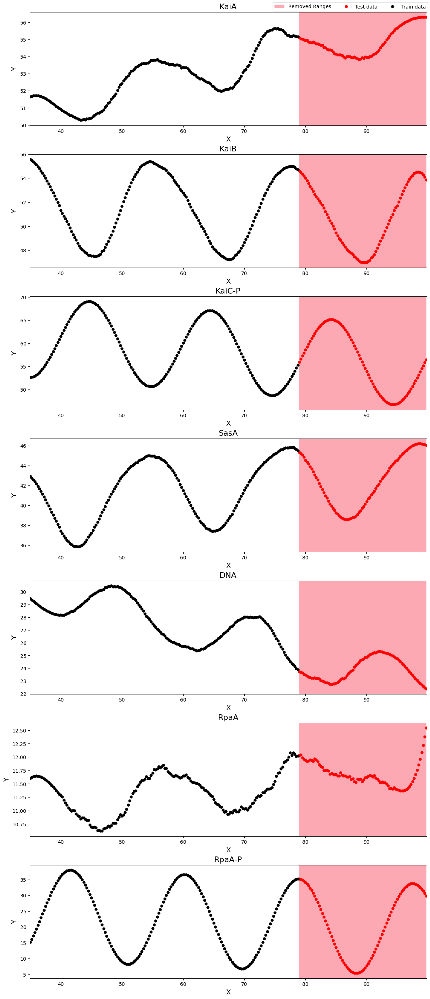

In [ ]:
mogptk_data.plot()

## MOGP Training

In [ ]:
# create model, uncomment for different kernels
mogptk_model = mogptk.MOSM(mogptk_data, Q=4)
# mogptk_model = mogptk.CSM(mogptk_data, Q=4)
# mogptk_model = mogptk.SM_LMC(mogptk_data, Q=2)
# mogptk_model = mogptk.CONV(mogptk_data, Q=2)

# initialize parameters of kernel using LombScargle
mogptk_model.init_parameters(method='BNSE', iters=10)

Starting optimization using Adam
‣ Model: Exact
  ‣ Kernel: MultiOutputSpectralMixtureKernel
  ‣ Likelihood: GaussianLikelihood
‣ Channels: 7
‣ Parameters: 147
‣ Training points: 1232
‣ Iterations: 100
    0/100   0:00:01  loss=     2267.99  error=     2.95547
   37/100   0:00:10  loss=     2056.32  error=     3.80302
   79/100   0:00:20  loss=     1962.38  error=     6.83969
  100/100   0:00:24  loss=     1915.29  error=     5.12537
Optimization finished in 25.043 seconds


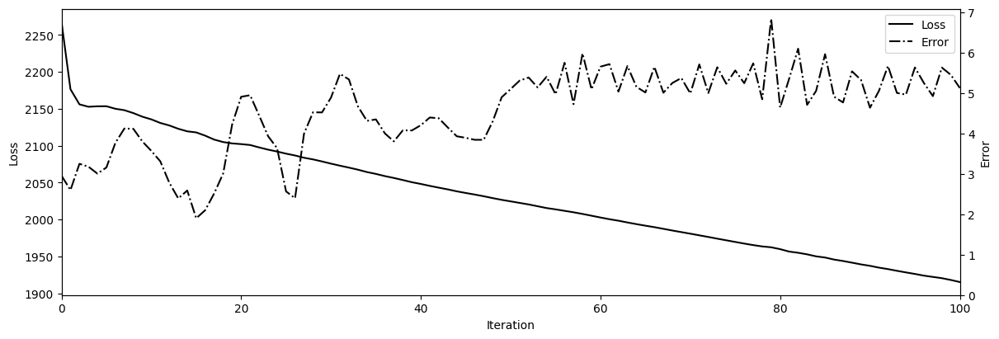

In [ ]:
mogptk_model.train(method='Adam', lr=0.02, iters=100, plot=True, error='MSE', verbose=True);

## MOGP Prediction

### Capture predictions in dataframe

In [ ]:
mogptk_time, mogptk_mu, mogptk_lower_ci, mogptk_upper_ci = mogptk_model.predict(
    X=None,
    ci=None,
    sigma=2,
    n=10000,
    transformed=False
)

In [ ]:
mogptk_mu[0].shape

(260,)

In [ ]:
mogptk_preds_df = pd.DataFrame(mogptk_mu,
                               index = dinner_smooth.iloc[:, 1:].columns.tolist()).T
mogptk_preds_df.insert(0, 'time', dinner_smooth['time'].values)
mogptk_preds_df

,time,KaiA,KaiB,KaiC-P,SasA,DNA,RpaA,RpaA-P
0,35.005,51.753692,55.457836,52.814916,42.444967,28.988522,11.582287,18.717300
1,35.255,51.741469,55.417948,52.704575,42.328914,28.909190,11.600028,19.420985
2,35.505,51.725613,55.354117,52.664767,42.192538,28.833880,11.614076,20.173341
3,35.755,51.706173,55.266317,52.695117,42.035767,28.762424,11.624243,20.970533
4,36.005,51.683199,55.154810,52.794624,41.858776,28.694661,11.630399,21.808257
...,...,...,...,...,...,...,...,...
255,98.764,57.062758,55.523982,53.158164,47.792577,22.762943,12.266966,37.919726
256,99.014,57.035757,55.521959,53.785195,47.724742,22.558090,12.286128,38.220085
257,99.264,57.004136,55.499491,54.417375,47.641122,22.358667,12.301784,38.397907
258,99.514,56.968619,55.457434,55.052229,47.541962,22.165820,12.314009,38.450417


### Modifying MOGPTK plot_prediction


Want to plot a square facet grid

In [ ]:
def plot_prediction(mogptk_model,
                    X=None,
                    title=None,
                    figsize=None,
                    legend=True,
                    errorbars=True,
                    nrows = None,
                    ncols = None,
                    suptitle=None,
                    supfontsize=40,
                    subfontsize=20,
                    ci=None,
                    sigma=2,
                    n=10000,
                    transformed=False):
    """
    Plot the data including removed observations, latent function, and predictions of this model for each channel.

    Args:
        X (list, dict): Array of shape (data_points,), (data_points,input_dims), or [(data_points,)] * input_dims per channel with prediction X values. If a dictionary is passed, the index is the channel index or name.
        title (str): Set the title of the plot.
        figsize (tuple): Set the figure size.
        legend (boolean): Disable legend.
        errorbars (boolean): Plot data error bars if available.
        ci (float,list of float): Confidence interval as a percentage or the two quantile limits [lower, upper] in the range of [0,1].
        sigma (float): Number of standard deviations to display upwards and downwards.
        n (int): Number of samples used from distribution to estimate quantile.
        transformed (boolean): Display transformed Y data as used for training.

    Returns:
        matplotlib.figure.Figure: The figure.
        list of matplotlib.axes.Axes: List of axes.

    Examples:
        >>> fig, axes = dataset.plot(title='Title')
    """
    X, Mu, Lower, Upper = mogptk_model.predict(X, ci=ci, sigma=sigma, n=n, transformed=transformed)
    if len(mogptk_model.dataset) == 1:
        X = [X]
        Mu = [Mu]
        Lower = [Lower]
        Upper = [Upper]

    if figsize is None:
        figsize = (12,4*len(mogptk_model.dataset))

    if nrows == None and ncols == None:
        nrows = len(mogptk_model.dataset)
        ncols = 1

    fig, ax = plt.subplots(nrows = nrows,
                           ncols = ncols,
                           figsize=figsize,
                           squeeze=False,
                           constrained_layout=True)
    for j, data in enumerate(mogptk_model.dataset):
        r, c = divmod(j, ncols)

        # TODO: ability to plot conditional or marginal distribution to reduce input dims
        if data.get_input_dims() > 2:
            raise ValueError("cannot plot more than two input dimensions")
        if data.get_input_dims() == 2:
            raise NotImplementedError("two dimensional input data not yet implemented") # TODO

        legends = []
        if errorbars and data.Y_err is not None:
            x, y = data.get_train_data(transformed=transformed)
            yl = data.Y[data.mask] - data.Y_err[data.mask]
            yu = data.Y[data.mask] + data.Y_err[data.mask]
            if transformed:
                yl = data.Y_transformer.forward(yl, x)
                yu = data.Y_transformer.forward(yu, x)
            x = x.astype(data.X_dtypes[0])
            ax[j,0].errorbar(x, y, [y-yl, yu-y], elinewidth=1.5, ecolor='lightgray', capsize=0, ls='', marker='')

        # prediction
        idx = np.argsort(X[j][:,0])
        x = X[j][idx,0].astype(data.X_dtypes[0])
        ax[r, c].plot(x, Mu[j][idx], ls=':', color='blue', lw=2)
        if not np.all(Lower[j][idx] == Mu[j][idx]) and not np.all(Upper[j][idx] == Mu[j][idx]):
            ax[r, c].fill_between(x, Lower[j][idx], Upper[j][idx], color='blue', alpha=0.3)
            legends.append(patches.Rectangle(
                (1, 1), 1, 1, fill=True, color='blue', alpha=0.3, lw=0, label='95% Error Bars'
            ))
        legends.append(plt.Line2D([0], [0], ls=':', color='blue', lw=2, label='Posterior Mean'))

        xmin = min(np.min(data.X), np.min(X[j]))
        xmax = max(np.max(data.X), np.max(X[j]))
        if data.F is not None:
            if np.issubdtype(data.X_dtypes[0], np.datetime64):
                dt = np.timedelta64(1,data.X.get_time_unit())
                n = int((xmax-xmin) / dt) + 1
                x = np.arange(xmin, xmax+np.timedelta64(1,'us'), dt, dtype=data.X_dtypes[0])
            else:
                n = len(data.X)*10
                x = np.linspace(xmin, xmax, n)

            y = data.F(x)
            if transformed:
                y = data.Y_transformer.forward(y, x)

            ax[r, c].plot(x, y, 'g--', lw=1)
            legends.append(plt.Line2D([0], [0], ls='--', color='g', label='Latent'))

        if data.has_test_data():
            x, y = data.get_test_data(transformed=transformed)
            x = x.astype(data.X_dtypes[0])
            ax[r, c].plot(x, y, 'r.', ms=10)
            legends.append(plt.Line2D([0], [0], ls='', color='r', marker='.', ms=10, label='Test data'))

        x, y = data.get_train_data(transformed=transformed)
        x = x.astype(data.X_dtypes[0])
        ax[r, c].plot(x, y, 'k.', ms=10)
        legends.append(plt.Line2D([0], [0], ls='', color='k', marker='.', ms=10, label='Train data'))

        if 0 < len(data.removed_ranges[0]):
            for removed_range in data.removed_ranges[0]:
                x0 = removed_range[0].astype(data.X_dtypes[0])
                x1 = removed_range[1].astype(data.X_dtypes[0])
                y0 = ax[r, c].get_ylim()[0]
                y1 = ax[r, c].get_ylim()[1]
                ax[r, c].add_patch(patches.Rectangle(
                    (x0, y0), x1-x0, y1-y0, fill=True, color='xkcd:strawberry', alpha=0.4, lw=0,
                ))
            legends.insert(0, patches.Rectangle(
                (1, 1), 1, 1, fill=True, color='xkcd:strawberry', alpha=0.4, lw=0, label='Removed Ranges'
            ))

        xmin = xmin.astype(data.X_dtypes[0])
        xmax = xmax.astype(data.X_dtypes[0])
        ax[r, c].set_xlim(xmin-(xmax-xmin)*0.001, xmax+(xmax-xmin)*0.001)
        ax[r, c].set_xlabel(data.X_labels[0])
        ax[r, c].set_ylabel(data.Y_label)
        ax[r, c].set_title(data.name if title is None else title, fontsize=subfontsize)

        ax[r, c].tick_params(axis='both', which='major', labelsize=24)
        ax[r, c].tick_params(axis='both', which='minor', labelsize=20)


        # plt.legend(handles=legends[::-1])
    fig.supxlabel('Time (hours)', fontsize = 50)
    fig.supylabel('KaiABC Oscillator Reading', fontsize = 50)
    fig.suptitle(suptitle, fontsize=supfontsize)

    if legend:
      fig.legend(handles=legends[::-1], bbox_to_anchor=(1.05, 0.5), loc='center left', fontsize= 50)
    return fig, ax

<ipython-input-57-46e2937775e9>:12: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, "mogptk_cyano_q4_mosm_w_kaic_small2.png"))
<ipython-input-57-46e2937775e9>:12: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, "mogptk_cyano_q4_mosm_w_kaic_small2.png"))
<ipython-input-57-46e2937775e9>:12: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, "mogptk_cyano_q4_mosm_w_kaic_small2.png"))
<ipython-input-57-46e2937775e9>:12: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument

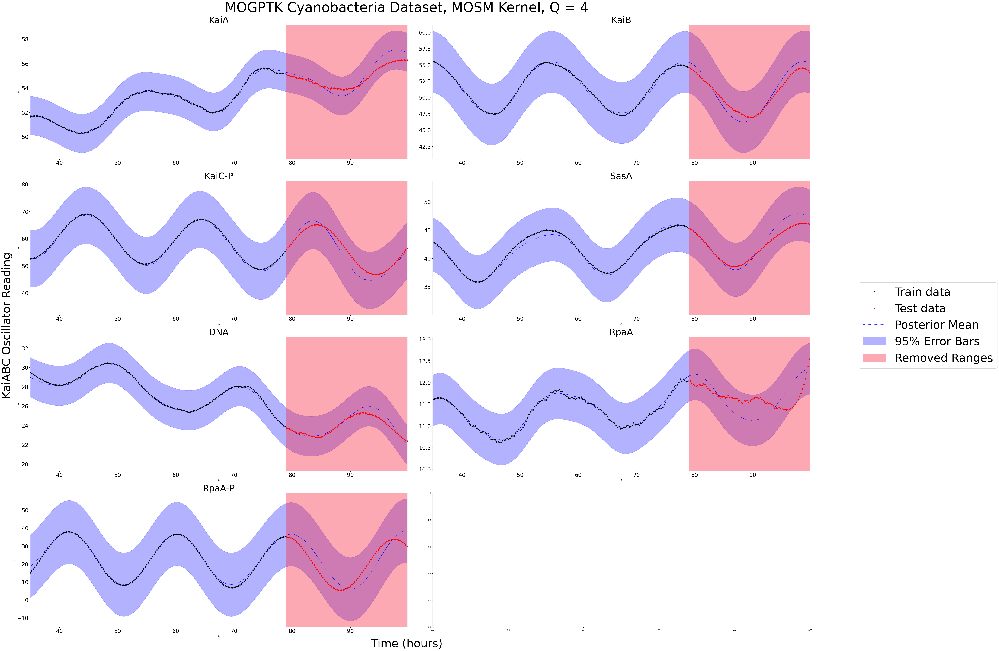

In [ ]:
suptitle = 'MOGPTK Cyanobacteria Dataset, MOSM Kernel, Q = 4'

plot_prediction(mogptk_model = mogptk_model,
                nrows = 4,
                ncols = 2,
                figsize = (50, 40),
                suptitle = suptitle,
                supfontsize=60,
                subfontsize= 40)


plt.savefig(os.path.join(plots_cyano_path, "mogptk_cyano_q4_mosm_w_kaic_small2.png"))
plt.show()

### [DO NOT USE] Q=4, MOSM, BNSE init, Normalized

<ipython-input-15-7c511207551d>:3: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, "mogptk_cyano_q4_mosm.png"))
<ipython-input-15-7c511207551d>:3: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, "mogptk_cyano_q4_mosm.png"))
<ipython-input-15-7c511207551d>:3: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_path, "mogptk_cyano_q4_mosm.png"))
<ipython-input-15-7c511207551d>:3: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no longer supported as of 3.3 an

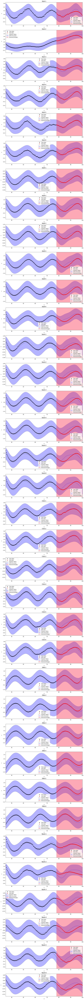

In [ ]:
# Normalized Dinner data, Q=4, BNSE init
mogptk_fig, mogptk_ax = mogptk_model.plot_prediction();
plt.savefig(os.path.join(plots_path, "mogptk_cyano_q4_mosm.png"))
plt.show()

### [DO NOT USE] Q=4, MOSM, LS Init, Normalized

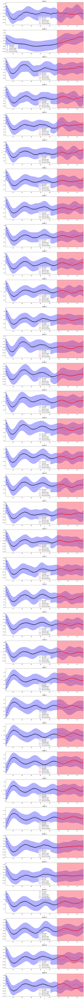

In [ ]:
# Normalized Dinner data
mogptk_model.plot_prediction();
plt.show()

### [Do not Re-Run] Q=4, MOSM, LS Init, Un-normalized

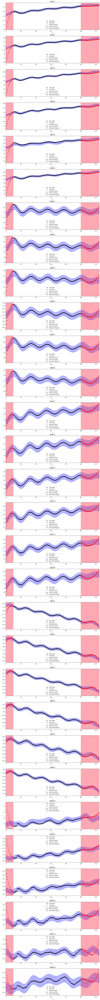

In [ ]:
# Unnormalized Dinner Data
mogptk_model.plot_prediction();
plt.show()

In [ ]:
mogptk_model.print_parameters()

Name,Range,Value
MultiOutputSpectralMixtureKernel.weight,"[1e-08, ∞)",[[1.86843303 1.24379492 0.92479179 0.62286908] [3.16491417 1.01542551 0.96012368 0.68331733] [2.28213727 0.75520517 0.59645037 0.45082194] [2.19666039 0.86993024 0.72444562 0.45231317] [1.77848099 1.15473071 0.8950054 0.63626344] [1.66641682 0.90899457 0.87235258 0.55837067] [3.22684656 1.48397239 1.38898907 1.01638037] [3.39333199 1.66183703 1.4544758 1.0770384 ] [3.29987362 1.45712103 1.39251482 1.05343006] [3.65227125 1.4024228 1.07649708 0.82726677] [2.86368515 1.8393709 1.41444212 1.05763442] [3.23046486 1.43978192 1.09414563 0.92611943] [2.62737475 1.63945163 0.73172054 0.52227656] [2.77143937 2.13494704 0.82879778 0.50555387] [3.57803958 1.91596475 1.21383425 0.81324212] [3.67061024 1.96224804 1.22180472 0.81284089] [3.18385455 1.94574252 1.12812756 0.79847415] [3.19562855 2.23829824 1.23494255 0.86932391] [2.2012219 1.09455907 0.94021629 0.73398283] [2.42521436 1.1130781 1.00383362 0.77155418] [2.29990253 0.92455213 0.73083892 0.56785583] [1.85685674 0.97718085 0.66680985 0.56553508] [1.80193338 1.32646222 0.88673444 0.6740211 ] [1.99691173 1.06965148 0.9171345 0.6871047 ] [3.34757105 2.10598152 1.37776675 0.95771896] [3.57199941 1.78249848 1.5145713 1.09968948] [3.24235562 1.87461991 1.36463817 0.92966103] [3.27435316 1.8362021 1.38505726 0.91945211] [3.62136405 1.30228667 1.26513076 1.03211892] [3.2950468 2.24649909 1.33412173 0.95519672] [2.57223594 1.30296789 1.00494032 0.80471542] [2.37189422 1.71406411 0.96459859 0.55556951] [2.85378161 1.26216688 1.0929613 0.94279334] [2.74237 1.10874544 0.76159612 0.76336602] [2.02860839 1.17599364 0.90305326 0.66831979] [2.29956021 1.5435428 0.97488878 0.7136616 ]]
MultiOutputSpectralMixtureKernel.mean,"[1e-08, 0.6666666666666666]",[[[0.03698917] [0.02279548] [0.07405546] [0.08372496]] [[0.01321648] [0.04237608] [0.03013513] [0.03929427]] [[0.04171358] [0.06858681] [0.08231886] [0.11909471]] [[0.04906738] [0.06543006] [0.07406239] [0.13135138]] [[0.04904352] [0.03078103] [0.06424144] [0.07909369]] [[0.04909751] [0.03217547] [0.06443422] [0.07920938]] [[0.04896065] [0.03083848] [0.06438266] [0.09369354]] [[0.04901194] [0.02329953] [0.0642858 ] [0.09371027]] [[0.04905545] [0.02332898] [0.06430921] [0.09365585]] [[0.04904953] [0.0655751 ] [0.0822747 ] [0.09366611]] [[0.04894544] [0.02330681] [0.07407743] [0.08364429]] [[0.04893347] [0.07101928] [0.08226877] [0.03060808]] [[0.04904391] [0.01762986] [0.06460819] [0.0935807 ]] [[0.04903479] [0.01767945] [0.06452533] [0.07906895]] [[0.04901404] [0.01760716] [0.06451125] [0.09367333]] [[0.04904412] [0.0176194 ] [0.06436768] [0.09372726]] [[0.04907705] [0.01769615] [0.07417922] [0.08396375]] [[0.04905585] [0.01770012] [0.07396706] [0.08378848]] [[0.0490888 ] [0.03081813] [0.06459483] [0.08362398]] [[0.04911661] [0.03088449] [0.06458284] [0.08377301]] [[0.04898233] [0.07106193] [0.02403837] [0.10626355]] [[0.04895414] [0.01779867] [0.0739643 ] [0.09360952]] [[0.04901605] [0.0231456 ] [0.07408568] [0.08364963]] [[0.04902172] [0.02340787] [0.07404236] [0.08374356]] [[0.04499391] [0.02155426] [0.07132366] [0.0837716 ]] [[0.04477527] [0.03062903] [0.07165676] [0.09367407]] [[0.04503786] [0.02155803] [0.07138026] [0.07916987]] [[0.04495344] [0.0215309 ] [0.07138314] [0.07907083]] [[0.04494862] [0.0710361 ] [0.02396341] [0.08384665]] [[0.04499404] [0.02158576] [0.07143258] [0.07910911]] [[0.04164609] [0.02344736] [0.06387514] [0.09371374]] [[0.04156851] [0.02328582] [0.06430471] [0.11912351]] [[0.04901709] [0.065676 ] [0.01157545] [0.08386428]] [[0.0417284 ] [0.06863423] [0.10379878] [0.02476415]] [[0.04896342] [0.02337503] [0.07406619] [0.08391088]] [[0.0489315 ] [0.02332692] [0.07403329] [0.08385747]]]
MultiOutputSpectralMixtureKernel.variance,"[1e-08, ∞)",[[[1.53454795e-04] [6.62025898e-07] [1.54077380e-05] [1.34661842e-05]] [[7.91376169e-06] [1.62045633e-05] [8.70618878e-06] [1.13778202e-05]] [[5.37960955e-05] [8.93877823e-06] [1.05344154e-05] [1.85034118e-05]] [[5.7748

## MOGP Covariance Matrix

In [ ]:
# K = self.gpr.K(X).cpu().numpy()

# # normalise
# diag_sqrt = np.sqrt(np.diag(K))
# K /= np.outer(diag_sqrt, diag_sqrt)


output_dims = len(mogptk_model.dataset)
X_ = np.zeros((output_dims, 2))
X_[:,0] = np.arange(output_dims)
K = mogptk_model.gpr.K(X_).cpu().numpy()

# normalize
diag_sqrt = np.sqrt(np.diag(K))
K /= np.outer(diag_sqrt, diag_sqrt)

# Transform numpy array to dataframe
gene_cols = dinner_smooth.iloc[:, 1:].columns.tolist()
mogptk_covariance_df = pd.DataFrame(K, index = gene_cols, columns = gene_cols)

mogptk_covariance_df

,KaiA,KaiB,KaiC-P,SasA,DNA,RpaA,RpaA-P
KaiA,1.000000,0.897776,0.541022,0.904952,-0.050986,0.698556,0.285475
KaiB,0.897776,1.000000,0.494509,0.842815,-0.284218,0.869478,0.120189
KaiC-P,0.541022,0.494509,1.000000,0.478054,-0.137827,0.445087,0.325520
SasA,0.904952,0.842815,0.478054,1.000000,0.179728,0.546962,0.397898
DNA,-0.050986,-0.284218,-0.137827,0.179728,1.000000,-0.660680,0.481843
RpaA,0.698556,0.869478,0.445087,0.546962,-0.660680,1.000000,-0.129542
RpaA-P,0.285475,0.120189,0.325520,0.397898,0.481843,-0.129542,1.000000


<ipython-input-26-651e7aecb418>:5: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, "mogptk_mosm_cyano_w_kaic_heatmap_small.png"))
<ipython-input-26-651e7aecb418>:5: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, "mogptk_mosm_cyano_w_kaic_heatmap_small.png"))
<ipython-input-26-651e7aecb418>:5: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, "mogptk_mosm_cyano_w_kaic_heatmap_small.png"))
<ipython-input-26-651e7aecb418>:5: MatplotlibDeprecationWarning: savefig() got unexpected keyword 

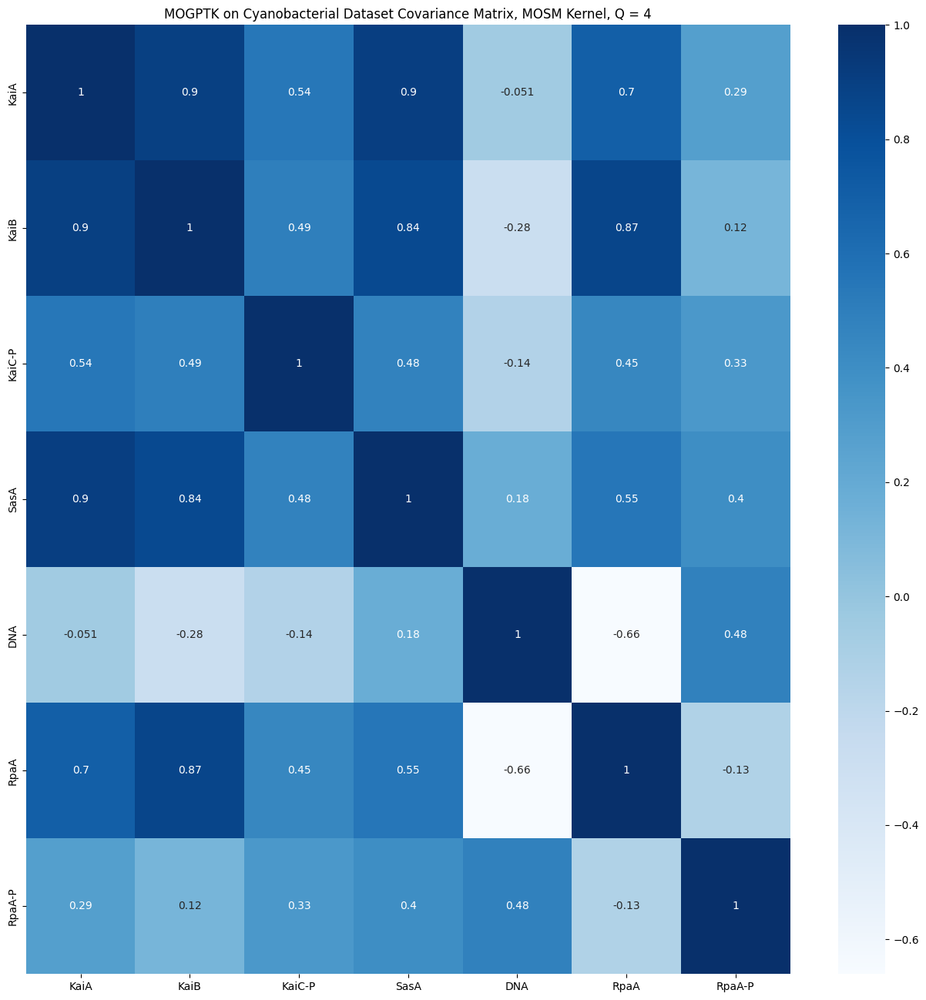

In [ ]:
plt.figure(figsize=(16,16))
sns.heatmap(mogptk_covariance_df, cmap = 'Blues',
            annot=True, xticklabels=True, yticklabels=True)
plt.title('MOGPTK on Cyanobacterial Dataset Covariance Matrix, MOSM Kernel, Q = 4')
plt.savefig(os.path.join(plots_cyano_path, "mogptk_mosm_cyano_w_kaic_heatmap_small.png"))


## MOGP Performance Metrics

In [ ]:
mogptk_pooled_mse = pooled_mse(pred_df = mogptk_preds_df.iloc[:, 1:],
                                true_df = dinner_smooth.iloc[:, 1:])
mogptk_r2 = r2_score(y_true = dinner_smooth.iloc[:, 1:], y_pred = mogptk_preds_df.iloc[:, 1:])
mogptk_coupling = compare_coupling(pred_df = mogptk_covariance_df,
                 true_df = true_adjacency)

In [ ]:
print(f"The Pooled MSE of the MOGPTK Model is {mogptk_pooled_mse}.")
print(f"The R^2 of the MOGPTK Model is {mogptk_r2}.")
print(f"The coupling accuracy is {mogptk_coupling}")

The Pooled MSE of the MOGPTK Model is 1.7727025368764562.
The R^2 of the MOGPTK Model is 0.923617423031905.
The coupling accuracy is 8.426149773176359


# NCDE (Noise-Perturbed)

## NCDE Configs

In [ ]:
# Data params
N_SNAPSHOTS = 5000 # number of observations
N_TIMEPOINTS = dinner_smooth.shape[0] # number of datapoints

# Model params
HIDDEN_SIZE = 64
WIDTH_SIZE = 64 # The size of each hidden layer.
OUTPUT_SIZE = dinner_smooth.shape[1] - 1 # output size, which here is the number of genes we want to output. # features = # genes = # columns in waves_df - 1 (because of time column)
DEPTH = 8
SEED = 12314
KEY = jr.PRNGKey(SEED)
train_data_key, test_data_key, model_key, loader_key = jr.split(KEY, 4)

add_noise = False
BATCH_SIZE = 32
lr = 1e-2
steps = 800

# Suppose we have lag-p auto-regressors
WINDOW_LENGTH = 4000
STEPSIZE = 10
NCDE_TRAIN_HIST_PROP = 0.8

## Helper Functions + Specify Model

In [ ]:
# First, define the function which will specify the vector field of
# the differential equation.
class Func(eqx.Module):
    mlp: eqx.nn.MLP
    data_size: int
    hidden_size: int

    def __init__(self, data_size, hidden_size, width_size, depth, *, key, **kwargs):
        super().__init__(**kwargs)
        self.data_size = data_size
        self.hidden_size = hidden_size
        self.mlp = eqx.nn.MLP(
            hidden_size,
            hidden_size * data_size,
            width_size,
            depth,
            activation=jnn.tanh,
            # Note the use of a tanh final activation function. This is important to
            # stop the model blowing up. (Just like how GRUs and LSTMs constrain the
            # rate of change of their hidden states.)
            final_activation=jnn.tanh,
            key=key,
        )

    def __call__(self, t, y, args):
        return self.mlp(y).reshape(self.hidden_size, self.data_size)

# The above Func will be solved as part of the NeuralCDE algo
# Below. Note we do have an MLP for the initial condition
# As well as the future iterations.

class NeuralCDE(eqx.Module):
    initial: eqx.nn.MLP
    func: Func
    linear: eqx.nn.Linear

    def __init__(self, data_size, hidden_size, width_size, output_size, depth, *, key, **kwargs):
        super().__init__(**kwargs)
        ikey, fkey, lkey = jr.split(key, 3)
        self.initial = eqx.nn.MLP(in_size = data_size,
                                  out_size = hidden_size,
                                  width_size = width_size,
                                  depth = depth,
                                  key = ikey)
        self.func = Func(data_size, hidden_size, width_size, depth, key=fkey)
        self.linear = eqx.nn.Linear(hidden_size, output_size, key=lkey)

    def __call__(self, ts, coeffs, evolving_out=False):
        # Each sample of data consists of some timestamps `ts`, and some `coeffs`
        # parameterising a control path. These are used to produce a continuous-time
        # input path `control`.
        control = diffrax.CubicInterpolation(ts, coeffs) # X term
        print(f"Finished control with {control}")
        term = diffrax.ControlTerm(self.func, control).to_ode() # dXt term in NCDE
        solver = diffrax.Tsit5()
        dt0 = None
        y0 = self.initial(control.evaluate(ts[0]))

        print(f"ts[0] shape: {ts[0].shape}")
        print(f"y0 shape: {y0.shape}")

        if evolving_out:
            saveat = diffrax.SaveAt(ts=ts)
        else:
            saveat = diffrax.SaveAt(t1=True)
        solution = diffrax.diffeqsolve(
            term,
            solver,
            ts[0],
            ts[-1],
            dt0,
            y0,
            stepsize_controller=diffrax.PIDController(rtol=1e-3, atol=1e-6),
            saveat=saveat,
        )

        # return solution.ys, y0
        if evolving_out:
            # applies self.linear to every value of y (meaning at every timepoint)
            prediction = jax.vmap(lambda y: self.linear(y))(solution.ys) # jax.vmap(lambda y: jnn.tanh(self.linear(y)[0])(solution.ys)
        else:
            # print(f"solution.ys has shape {solution.ys.shape}")
            prediction = self.linear(solution.ys[-1]) # jnn.tanh(self.linear(solution.ys[-1])) # (prediction, )
        return prediction

# Data Processing Functions
def dataloader(arrays, batch_size, *, key):
    dataset_size = arrays[0].shape[0]
    assert all(array.shape[0] == dataset_size for array in arrays)
    indices = jnp.arange(dataset_size)
    while True:
        perm = jr.permutation(key, indices)
        (key,) = jr.split(key, 1)
        start = 0
        end = batch_size
        while end < dataset_size:
            batch_perm = perm[start:end]
            yield tuple(array[batch_perm] for array in arrays)
            start = end
            end = start + batch_size

def window_stack(df, width=3, stepsize=1):
    """
    Takes in waves_df (T, G) dimension (T = # timepoints, G = # genes)
    and slides a window of length width (W), sliding over on stepsize at a time,
    to return two datasets:

    1. Jax array of feature vectors, size (T - W, G, W)
    2. Jax array of target vectors, size (T - W, G, 1)
    """

    dat = df.drop(labels = 'time', axis = 1) # remove time column
    dat = dat.T # transpose from [time, genes] to [genes, time]
    dat = dat.values # only gets values, which will make us lose gene index
    max_T = dat.shape[1] # number of timepoints
    range_T = df.time.to_list() # store all timepoints in a list

    # Create windowed Jax array for features (technically autoregressors)
    feat_window_list = [dat[:, k: (k + width)] for k in range(0, max_T - width, stepsize)]
    feat_window_jnp = jnp.array(feat_window_list) # turns this into a Jax array of size [T - W, G, W]
    feat_window_jnp = jnp.moveaxis(feat_window_jnp, -1, -2) # transposes last two axis so we get [T - W, W, G]

    # Prep timepoints to be stacked with the features, as this is a requirement for the diffrax training method
    time_window_jnp = jnp.array([range_T[k:k + width] for k in range(0, max_T - width, stepsize)]) # size [T - W, W]
    time_windowed = jnp.expand_dims(time_window_jnp, -1) # to [T - W, W, 1]

    # Concatenate (T - W, W, G) tensor of features with (T - W, W, 1) tensor of time to get a (T - W, W, G + 1) tensor of features + time
    x_windowed = jnp.concatenate([time_windowed, feat_window_jnp], axis = -1)

    # Create windowed Jax array for target (= response) variables
    target_window_list = [dat[:, k + width] for k in range(0, max_T - width, stepsize)]
    target_window_jnp = jnp.array(target_window_list) # turns into a Jax array of size [T - W, G]
    y_windowed = jnp.expand_dims(target_window_jnp, -2) # makes it same dimensionality as feat_window_jnp, i.e., [T - W, G] to [T - W, 1, G]

    return x_windowed, y_windowed, time_windowed

# Modeling Functions
def train_test_split(X, y, t, pct_hist):
    max_T = X.shape[0]
    hist_cutoff = int(max_T * pct_hist)

    X_hist, y_hist, t_hist = X[:hist_cutoff, :, :], y[:hist_cutoff, :, :], t[:hist_cutoff, :, :]
    X_future, y_future, t_future = X[hist_cutoff:, :, :], y[hist_cutoff:, :, :], t[hist_cutoff:, :, :]

    return X_hist, y_hist, t_hist, X_future, y_future, t_future


def cubic_spline_interpolation(X_stack, t_stack):
    # Do cubic spline interpolation to get X
    if t_stack.ndim == 3:
        t_stack = t_stack[:, :, 0]

    coeffs = jax.vmap(diffrax.backward_hermite_coefficients)(t_stack, X_stack)

    return coeffs

## Data Transformations for Training

In [ ]:
dinner_noise_iter = []

for i in range(N_SNAPSHOTS):
  dinner_wo_time = dinner_smooth.iloc[:, 1:] # shape :  (n_timepoints, n_genes)
  noise = np.random.normal(0, 0.001, dinner_wo_time.shape)
  dinner_wo_time = dinner_wo_time + noise # (n_timepoints, n_genes + 1)

  dinner_noise_iter.append(dinner_wo_time)

dinner_noise_iter = np.stack(dinner_noise_iter) # (n_shapshots, n_timepoints, n_genes + 1)

dinner_noise_iter.shape

(5000, 260, 7)

In [ ]:
# Get a 1D vector of timepoints from the dataset
t_vec = dinner_smooth['time'].values.reshape(-1, 1)
print(f"Shape of t_vec: {t_vec.shape}")
# repeat over N_SNAPSHOTS rows to prep for the NCDE training format
t_mat = np.tile(t_vec, (N_SNAPSHOTS, 1, 1))
print(f"Shape of t_mat: {t_mat.shape}")
# Prep it for training by removing the third dimension and remove last timepoint to fit training X_waveforms later
t_mat2d = t_mat[:, :N_TIMEPOINTS - 1, 0]
print(f"Shape of the t_mat2d is currently {t_mat2d.shape}.")

# Concatenate training data with timestamps to create waveforms_all
waveforms_all = jnp.concatenate([t_mat, dinner_noise_iter], axis = -1)
print(f"Shape of the waveforms_all is currently {waveforms_all.shape}")

# Split data into X and y
X_waveforms = waveforms_all[:, :N_TIMEPOINTS - 1, :]
y_waveforms = dinner_noise_iter[:, N_TIMEPOINTS - 1:, :]
y_waveforms_evol = dinner_noise_iter[:, :N_TIMEPOINTS - 1, :]
print(f"Created X_waveforms with shape {X_waveforms.shape} and y_waveforms with shape {y_waveforms.shape}.")

# Create cubic spline over X
coeffs = cubic_spline_interpolation(X_waveforms, t_mat2d)
print(f"Length of the coefficients is currently {len(coeffs)} with each element having shape {coeffs[0].shape}.")


Shape of t_vec: (260, 1)
Shape of t_mat: (5000, 260, 1)
Shape of the t_mat2d is currently (5000, 259).
Shape of the waveforms_all is currently (5000, 260, 8)
Created X_waveforms with shape (5000, 259, 8) and y_waveforms with shape (5000, 1, 7).
Length of the coefficients is currently 4 with each element having shape (5000, 258, 8).


## Train NCDE Model

### Run: 4/13/2025 7:04 PM, 500 steps, Depth = 4 (2x)

Finished control with CubicInterpolation(
  ts=f32[259], coeffs=[f32[258,8], f32[258,8], f32[258,8], f32[258,8]]
)
ts[0] shape: ()
y0 shape: (64,)
y_true: (32, 259, 7); y_pred: (32, 259, 7).
Step: 0, Loss: 1752.90869140625, Accuracy: 1752.90869140625, Computation time: 16.794310569763184
Step: 1, Loss: 1743.08544921875, Accuracy: 1743.08544921875, Computation time: 1.76177978515625
Step: 2, Loss: 1733.1219482421875, Accuracy: 1733.1219482421875, Computation time: 1.7347230911254883
Step: 3, Loss: 1723.26611328125, Accuracy: 1723.26611328125, Computation time: 1.7456645965576172
Step: 4, Loss: 1713.547119140625, Accuracy: 1713.547119140625, Computation time: 1.7538204193115234
Step: 5, Loss: 1703.909912109375, Accuracy: 1703.909912109375, Computation time: 1.8061432838439941
Step: 6, Loss: 1693.8787841796875, Accuracy: 1693.8787841796875, Computation time: 1.866091251373291
Step: 7, Loss: 1684.044189453125, Accuracy: 1684.044189453125, Computation time: 1.7959036827087402
Step: 8, Loss:

<ipython-input-88-91f9bf3c71ec>:137: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, 'ncde_cyano_w_kaic_loss_64_hs_small.png'))
<ipython-input-88-91f9bf3c71ec>:137: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, 'ncde_cyano_w_kaic_loss_64_hs_small.png'))
<ipython-input-88-91f9bf3c71ec>:137: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, 'ncde_cyano_w_kaic_loss_64_hs_small.png'))
<ipython-input-88-91f9bf3c71ec>:137: MatplotlibDeprecationWarning: savefig() got unexpected keyword argu

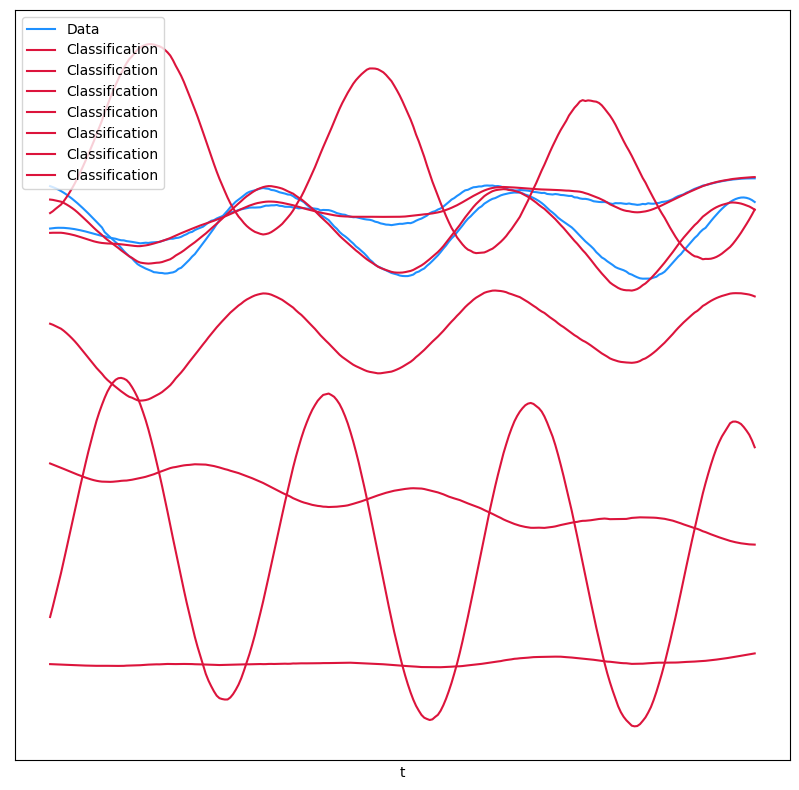

In [ ]:
# Training loop like normal.
### Model Instantiation ###
# NeuralCDEV2 is a class that takes in an (N, T - 1, G) tensor and the network architecture params.
# When instantiated (as done below)
model_sim = NeuralCDE(data_size = X_waveforms.shape[-1],
                      hidden_size = HIDDEN_SIZE,
                      width_size = WIDTH_SIZE,
                      output_size = OUTPUT_SIZE,
                      depth = DEPTH,
                      key = model_key)

### FUNCTIONS ###
def ncde_predict(model, ti, coeff_i, evolving_out = False):
    if evolving_out:
        def model_evolving(ts, coeffs):
            return model(ts, coeffs, evolving_out = True)
        return jax.vmap(model_evolving)(ti, coeff_i)
    else:
        return jax.vmap(model)(ti, coeff_i)

def compute_mse(y_true, y_pred, epsilon=1e-15):
    """
    MSE Loss for forecasting with real numbers
    """
    # if y_true.ndim == 3:
    #     y_true = y_true[:, 0, :]

    # Ensure predictions are clipped to avoid log(0)
    # y_pred = jnp.clip(y_pred, epsilon, 1 - epsilon)

    # Calculate the categorical cross-entropy
    # loss = jnp.mean(optax.l2_loss(y_pred, y_true))
    loss = jnp.mean((y_true - y_pred)**2, axis=1)

    # Return the mean loss over all samples
    return jnp.mean(loss)

@eqx.filter_jit
def loss(model, ti, y_true, coeff_i, evolving_out = False):
    pred = ncde_predict(model, ti, coeff_i, evolving_out = evolving_out)

    print(f"y_true: {y_true.shape}; y_pred: {pred.shape}.")

    # MSE
    mse_val = compute_mse(y_true = y_true, y_pred = pred)

    # mse_val = jnp.mean(mse_val)

    return mse_val, mse_val

# has_aux true will return two values: output to be differentiated and its gradient
grad_loss = eqx.filter_value_and_grad(loss, has_aux=True)

@eqx.filter_jit
def make_step(model, data_i, opt_state):
    ti, label_i, label_all_i, *coeff_i = data_i

    (mse_val, _), grads = grad_loss(model, ti, label_all_i, coeff_i, evolving_out = True)
    updates, opt_state = optim.update(grads, opt_state)
    model = eqx.apply_updates(model, updates)
    return mse_val, model, opt_state

# Data Processing Functions
def dataloader(arrays, batch_size, *, key):
    dataset_size = arrays[0].shape[0]
    assert all(array.shape[0] == dataset_size for array in arrays)
    indices = jnp.arange(dataset_size)
    while True:
        perm = jr.permutation(key, indices)
        (key,) = jr.split(key, 1)
        start = 0
        end = batch_size
        while end < dataset_size:
            batch_perm = perm[start:end]
            yield tuple(array[batch_perm] for array in arrays)
            start = end
            end = start + batch_size


### EXECUTION ###
# Optional section
optim = optax.adam(1e-4)
opt_state = optim.init(eqx.filter(model_sim, eqx.is_inexact_array))
for step, data_i in zip(
    range(steps), dataloader((t_mat2d, y_waveforms, y_waveforms_evol) + coeffs, BATCH_SIZE, key=loader_key)
):
    start = time.time()
    mse_val, model_sim, opt_state = make_step(model_sim, data_i, opt_state)
    end = time.time()
    print(
        f"Step: {step}, Loss: {mse_val}, Accuracy: {mse_val}, Computation time: "
        f"{end - start}"
    )

# ts, coeffs, labels, _ = get_data(dataset_size, add_noise, key=test_data_key)
(mse_val, _) = loss(model = model_sim,
                    ti = t_mat2d,
                    y_true = y_waveforms,
                    coeff_i = coeffs)
print(f"Test loss: {mse_val}, Test Accuracy: {mse_val}")

# Plot results : Data Preparation for Plotting
sample_ts = t_mat2d[-1] # gets the last waveform in the dataset [size: (N_TIMEPOINTS - 1,)]
# coeffs is a list of four tensors for each cubic spliene coefficient,
# so we get, for each coefficient tensor, the last row which is the coefficients of the last tensor
sample_coeffs = tuple(c[-1] for c in coeffs)
# Get predictions for that waveform
pred = model_sim(sample_ts, sample_coeffs, evolving_out=True)
# This interpolates data for the coefficients
interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# Evaluates sample time series for the actual values
values = jax.vmap(interp.evaluate)(sample_ts)

# Plot 1
fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1)

ax1.plot(sample_ts, values[:, 1], c="dodgerblue")
ax1.plot(sample_ts, values[:, 2], c="dodgerblue", label="Data")
ax1.plot(sample_ts, pred, c="crimson", label="Classification")
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xlabel("t")
ax1.legend()

# Plot 2
# ax2 = fig.add_subplot(1, 2, 2, projection="3d")
# ax2.plot(values[:, 1], values[:, 2], c="dodgerblue", label="Data")
# ax2.plot(values[:, 1], values[:, 2], pred[:, 1], c="crimson", label="Classification")
# ax2.set_xticks([])
# ax2.set_yticks([])
# ax2.set_zticks([])
# ax2.set_xlabel("x")
# ax2.set_ylabel("y")
# ax2.set_zlabel("Classification")
plt.tight_layout()
plt.savefig(os.path.join(plots_cyano_path, 'ncde_cyano_w_kaic_loss_64_hs_small.png'))
plt.show()

## Plot Predictions

Finished control with CubicInterpolation(
  ts=f64[259](numpy), coeffs=(f32[258,8], f32[258,8], f32[258,8], f32[258,8])
)
ts[0] shape: ()
y0 shape: (64,)


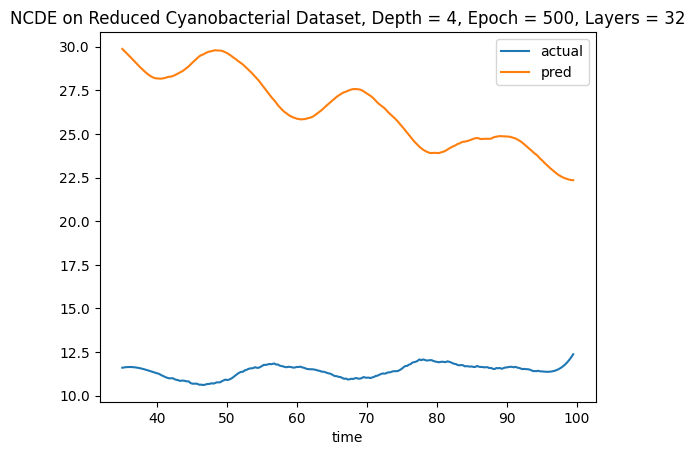

In [ ]:
ncde_pred_df = model_sim(sample_ts, sample_coeffs, evolving_out=True)

# # This interpolates data for the coefficients
# sample_interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# # Evaluate sample time series for the actual values
# sample_values = jax.vmap(sample_interp.evaluate)(sample_ts)

samp_idx = 5
colname = dinner_smooth.iloc[:, 1:].columns.tolist()[samp_idx]

actual_data = dinner_smooth.iloc[:-1, :].loc[:, colname].values
pred_data = ncde_pred_df[:, samp_idx - 1]

sample_pred_df = pd.DataFrame({'t': sample_ts, 'actual': actual_data, 'pred': pred_data})
sample_pred_df = sample_pred_df.sort_values(by = 't', ascending = True)

# Plot
sample_pred_df.plot(x = 't')
plt.xlabel('time')
plt.title('NCDE on Reduced Cyanobacterial Dataset, Depth = 4, Epoch = 500, Layers = 32')
plt.show()

Finished control with CubicInterpolation(
  ts=f64[259](numpy), coeffs=(f32[258,8], f32[258,8], f32[258,8], f32[258,8])
)
ts[0] shape: ()
y0 shape: (64,)


<ipython-input-90-f45c88a35407>:45: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, 'ncde_cyano_w_kaic_small_d4_ep500_l64.png'))
<ipython-input-90-f45c88a35407>:45: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, 'ncde_cyano_w_kaic_small_d4_ep500_l64.png'))
<ipython-input-90-f45c88a35407>:45: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, 'ncde_cyano_w_kaic_small_d4_ep500_l64.png'))
<ipython-input-90-f45c88a35407>:45: MatplotlibDeprecationWarning: savefig() got unexpected keyword ar

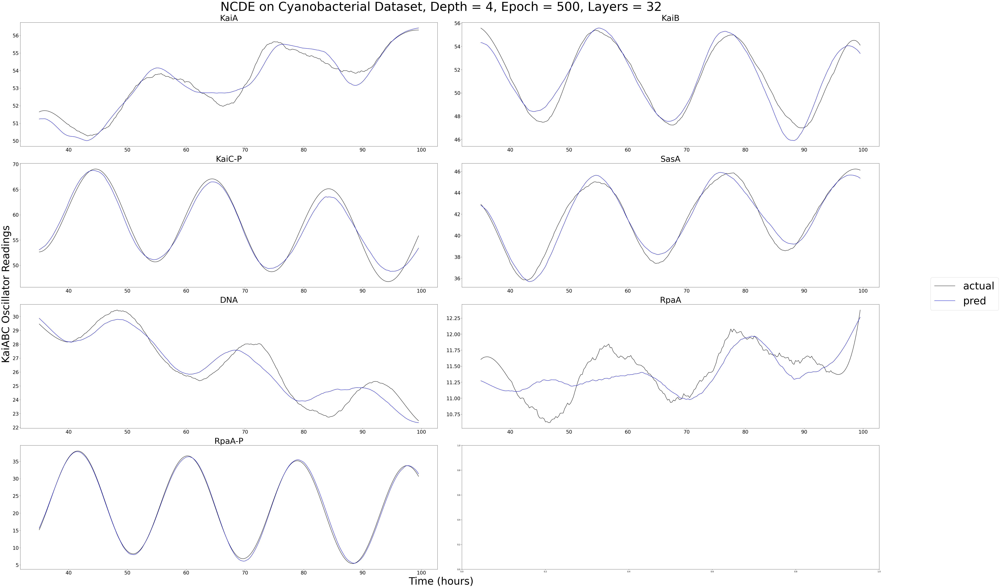

In [ ]:
gene_cols = dinner_smooth.iloc[:, 1:].columns.tolist()

ncde_pred_df = model_sim(sample_ts, sample_coeffs, evolving_out=True)
ncde_pred_df = pd.DataFrame(ncde_pred_df, columns = gene_cols)

# # This interpolates data for the coefficients
# sample_interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# # Evaluate sample time series for the actual values
# sample_values = jax.vmap(sample_interp.evaluate)(sample_ts)

fig, ax = plt.subplots(4, 2, figsize = (60, 40), layout="constrained")

for col in range(ncde_pred_df.shape[1]):
  r, c = divmod(col, 2)

  colname = gene_cols[col]

  actual_data = dinner_smooth.iloc[:-1, :].loc[:, colname].values
  pred_data = ncde_pred_df[colname].values

  sample_pred_df = pd.DataFrame({'t': sample_ts, 'actual': actual_data, 'pred': pred_data})
  sample_pred_df = sample_pred_df.sort_values(by = 't', ascending = True)

  ax[r, c].plot(sample_pred_df['t'].values,
                sample_pred_df['actual'].values,
                label = 'actual',
                color = 'black')
  ax[r, c].plot(sample_pred_df['t'].values,
                sample_pred_df['pred'].values,
                label = 'pred',
                color = 'blue')
  ax[r, c].set_title(colname, fontsize = 40)
  ax[r, c].tick_params(axis='both', which='major', labelsize=24)
  ax[r, c].tick_params(axis='both', which='minor', labelsize=20)


fig.supxlabel('Time (hours)', fontsize = 50)
fig.supylabel('KaiABC Oscillator Readings', fontsize = 50)

handles, labels = ax[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, bbox_to_anchor=(1.05, 0.5), loc='center left', fontsize= 50)

suptitle_ncde = 'NCDE on Cyanobacterial Dataset, Depth = 4, Epoch = 500, Layers = 32'
plt.suptitle(suptitle_ncde, fontsize = 60)
plt.savefig(os.path.join(plots_cyano_path, 'ncde_cyano_w_kaic_small_d4_ep500_l64.png'))
plt.show()

## Performance Metrics

In [ ]:
ncde_pooled_mse = pooled_mse(ncde_pred_df, dinner_smooth.iloc[:-1, 1:])
ncde_r2 = r2_score(y_true = dinner_smooth.iloc[:-1, 1:], y_pred = ncde_pred_df)
print(f"Pooled MSE: {ncde_pooled_mse}")
print(f"R2: {ncde_r2}")

# Pooled MSE: 38.56730090670814
# R2: -15.352657946934638

Pooled MSE: 0.4712764680334548
R2: 0.8510485864051943


# Koopman

## Koopman Configs

In [ ]:
# Data params
N_SNAPSHOTS = 1000 # number of observations
N_TIMEPOINTS = dinner_smooth.shape[0] # number of datapoints
DT = 1
X0_koop = dinner_smooth.iloc[0, 1:].values # gets first row (0) and all columns except time (1:)
time_vec = dinner_smooth['time'].values

In [ ]:
X0_koop.shape

(7,)

## Data Transformations for Training

In [ ]:
dinner_noise_iter = []

X_edmds = []
Y_edmds = []

for i in range(N_SNAPSHOTS):
  # Get all waveforms without the time column
  dinner_wo_time = dinner_smooth.iloc[:, 1:] # shape :  (n_timepoints, n_genes)

  # Add noise
  noise = np.random.normal(0, 0.01, dinner_wo_time.shape)
  dinner_wo_time = dinner_wo_time + noise # (n_timepoints, n_genes)

  # Shape: (n_timepoints - 1, n_genes)
  X_edmd = dinner_wo_time.iloc[:-1, :]
  Y_edmd = dinner_wo_time.iloc[1:, :]

  X_edmds.append(X_edmd)
  Y_edmds.append(Y_edmd)

# Shape: ((n_timepoints - 1) * N_SNAPSHOTS, n_genes)
X_edmds = np.vstack(X_edmds)
Y_edmds = np.vstack(Y_edmds)

Xkoop_test = dinner_smooth.iloc[:, 1:].values

  # dinner_noise_iter.append(dinner_wo_time)

# dinner_noise_iter = np.concatenate(dinner_noise_iter, axis = 0) # (n_shapshots * n_timepoints, n_genes)

In [ ]:
Y_edmds.shape

(259000, 7)

In [ ]:
Xtest = dinner_smooth.iloc[:, 1:].values
Xtest.shape

(260, 7)

## Koopman Training

### EDMD Fit

In [ ]:
## Training
regr = pk.regression.EDMD()
obsv = pk.observables.Polynomial(degree=2)

model_edmd = pk.Koopman(observables=obsv, regressor=regr)


In [ ]:
# Takes a lot of RAM to run
model_edmd.fit(X_edmds, y=Y_edmds, dt=DT)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning: The attribute `n_input_features_` was deprecated in version 1.0 and will be removed in 1.2.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning: The attribute `n_input_features_` was deprecated in version 1.0 and will be removed in 1.2.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning: The attribute `n_input_features_` was deprecated in version 1.0 and will be removed in 1.2.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning: The attribute `n_input_features_` was deprecated in version 1.0 and will be removed in 1.2.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:103: FutureWarning: The att

Koopman(observables=Polynomial(), regressor=EDMD())

### DMD Fit

In [ ]:
dmd = DMD(svd_rank=7) # the rank choice influences performance a lot. Here, there are 7 unique protein oscillators hence we only choose those.

model_dmd = pk.Koopman(regressor=dmd)
model_dmd.fit(X_edmd.values, Y_edmd.values)
model_dmd.time['dt']=time_vec[1] - time_vec[0]

NameError: name 'DMD' is not defined

### DMD Simulate (Predict)

In [ ]:
koopman_pred_df = model_dmd.simulate(x0 = X0_koop, n_steps = len(time_vec))
koopman_pred_df = pd.DataFrame(koopman_pred_df, columns = dinner_smooth.iloc[:, 1:].columns.tolist())

/usr/local/lib/python3.11/dist-packages/pykoopman/koopman.py:292: ComplexWarning: Casting complex values to real discards the imaginary part
  x = x.astype(self.A.dtype)


In [ ]:
koopman_pred_df.shape

(260, 7)

## Plot DMD Simulation

In [ ]:
fig, axs = plt.subplots(4, 2,
                        figsize=(60, 40),
                        layout = "constrained")

Xmin = min(Xkoop_test.shape[0], koopman_pred_df.shape[0])

gene_cols = dinner_smooth.iloc[:, 1:].columns.tolist()

for col in range(koopman_pred_df.shape[1]):
  r, c = divmod(col, 2)

  colname = gene_cols[col]

  axs[r, c].plot(time_vec[:Xmin],
                 Xkoop_test[:Xmin, col],
                 '-',
                 color='b',
                 label='Actual')
  axs[r, c].plot(time_vec[:Xmin],
                 koopman_pred_df.iloc[:Xmin, :].loc[:, colname].values,
                 '--r',
                 label='Pred')
  axs[r, c].legend()
  axs[r, c].set_title(colname, fontsize = 40)
  axs[r, c].tick_params(axis='both', which='major', labelsize=24)
  axs[r, c].tick_params(axis='both', which='minor', labelsize=20)


handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, bbox_to_anchor=(1.05, 0.5), loc='center left', fontsize= 50)

fig.supxlabel('Time (hours)', fontsize = 50)
fig.supylabel('KaiABC Oscillator Readings', fontsize = 50)

# Plot
suptitle_ncde = 'Koopman on Cyanobacterial Dataset, r = 7'
plt.suptitle(suptitle_ncde, fontsize = 60)
plt.savefig(os.path.join(plots_cyano_path, 'dmd_cyano_w_kaic_r7.png'))
plt.show()

NameError: name 'plt' is not defined

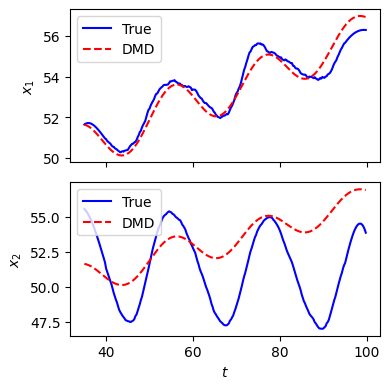

In [ ]:
fig, axs = plt.subplots(2, 1, sharex=True, tight_layout=True, figsize=(4, 4))

Xmin = min(Xkoop_test.shape[0], koopman_pred_df.shape[0])

axs[0].plot(time_vec[:Xmin], Xkoop_test[:Xmin, 0], '-', color='b', label='True')
axs[0].plot(time_vec[:Xmin], koopman_pred_df.iloc[:Xmin, 0].values, '--r', label='DMD')
axs[0].set(ylabel=r'$x_1$')
axs[1].plot(time_vec[:Xmin], Xkoop_test[:Xmin, 1], '-', color='b', label='True')
axs[1].plot(time_vec[:Xmin], koopman_pred_df.iloc[:Xmin, 0].values, '--r', label='DMD')
axs[1].set(
        ylabel=r'$x_2$',
        xlabel=r'$t$')
for i in range(2):
    axs[i].legend(loc='best')

## Eigenvectors

In [ ]:
koop_lv_eigenvals = np.log(np.linalg.eig(model_dmd.A)[0])/DT

print(f"koopman eigenvalues = {koop_lv_eigenvals}")

koopman eigenvalues = [-0.0011752 +0.07952409j -0.0011752 -0.07952409j -0.00772624+0.07305745j
 -0.00772624-0.07305745j  0.00571928+0.j         -0.00025658+0.j
 -0.00782792+0.j        ]


In [ ]:
for eigval in model_dmd.continuous_lamda_array:
    print('continuous eigenvalue = ',eigval)


continuous eigenvalue =  (-0.004700796828165905+0.31809635346637455j)
continuous eigenvalue =  (-0.004700796828165905-0.31809635346637455j)
continuous eigenvalue =  (-0.03090494255277178+0.29222978466142313j)
continuous eigenvalue =  (-0.03090494255277178-0.29222978466142313j)
continuous eigenvalue =  (0.02287713411484865+0j)
continuous eigenvalue =  (-0.0010263394726679734+0j)
continuous eigenvalue =  (-0.03131167263285358+0j)


<AxesSubplot:>

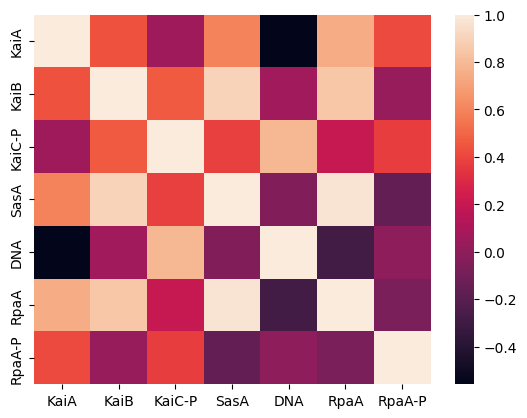

In [ ]:
modes_real_df = pd.DataFrame(model_dmd.W.real)
modes_real_corr = modes_real_df.T.corr()
modes_real_corr.index = dinner_smooth.iloc[:, 1:].columns.tolist()
modes_real_corr.columns = dinner_smooth.iloc[:, 1:].columns.tolist()

sns.heatmap(modes_real_corr)

<AxesSubplot:>

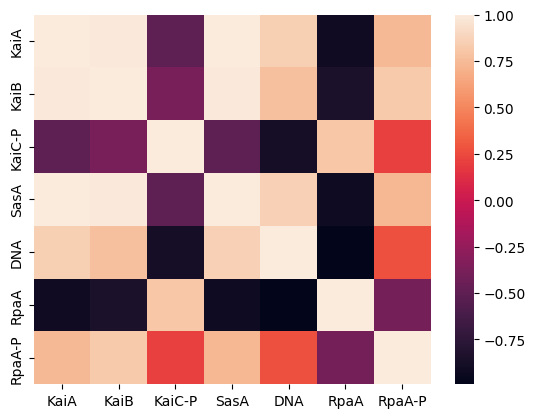

In [ ]:
modes_imag_df = pd.DataFrame(model_dmd.W.imag)
modes_imag_corr = modes_imag_df.T.corr()
modes_imag_corr.index = dinner_smooth.iloc[:, 1:].columns.tolist()
modes_imag_corr.columns = dinner_smooth.iloc[:, 1:].columns.tolist()

sns.heatmap(modes_imag_corr)

In [ ]:
def manual_covariance(x):
    mean = x.mean(axis=1)
    print(x.shape[1])
    cov = np.zeros((len(x), len(x)), dtype='complex64')

    for i in range(len(mean)):
        for k in range(len(mean)):
            s = 0
            for j in range(len(x[1])):  # 5 Col
                s += np.dot((x[i,j] - mean[i]), np.conj(x[k,j] - mean[i]))
            cov[i, k] = s / ((x.shape[1]) - 1)
    return cov

7


<ipython-input-104-cfe00f6ab1df>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, 'dmd_cyano_w_kaic_r7_cov.png'))
<ipython-input-104-cfe00f6ab1df>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, 'dmd_cyano_w_kaic_r7_cov.png'))
<ipython-input-104-cfe00f6ab1df>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, 'dmd_cyano_w_kaic_r7_cov.png'))
<ipython-input-104-cfe00f6ab1df>:11: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which 

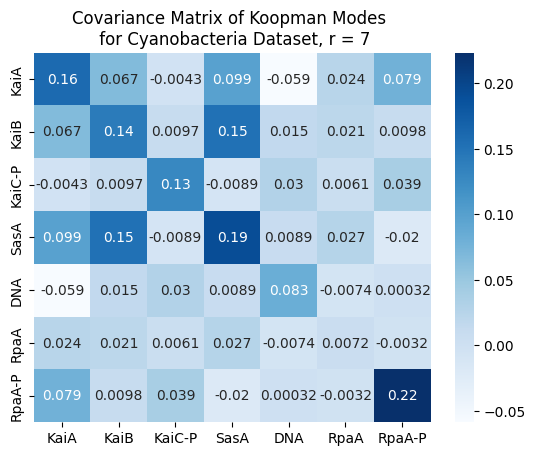

In [ ]:
modes_both_df = pd.DataFrame(manual_covariance(model_dmd.W).real,
                            index = dinner_smooth.iloc[:, 1:].columns.tolist(),
                            columns = dinner_smooth.iloc[:, 1:].columns.tolist()
                            )

sns.heatmap(modes_both_df,
            cmap = 'Blues',
            annot=True, xticklabels=True, yticklabels=True)
plt.title("Covariance Matrix of Koopman Modes \n" +
          " for Cyanobacteria Dataset, r = 7")
plt.savefig(os.path.join(plots_cyano_path, 'dmd_cyano_w_kaic_r7_cov.png'))

## Koopman / DMD Performance Metrics

### Pooled MSE

In [ ]:
koopman_pooled_mse = pooled_mse(true_df = dinner_smooth.iloc[:, 1:], pred_df = koopman_pred_df)

### R2

In [ ]:
koopman_pooled_r2 = r2_score(y_true = dinner_smooth.iloc[:, 1:], y_pred = koopman_pred_df)

### Coupling

In [ ]:
koop_coupling = compare_coupling(pred_df = modes_both_df,
                                 true_df = true_adjacency)
koop_coupling

7.937253933193772

### Summary of Performance Metrics

In [ ]:
print(f"Pooled MSE: {koopman_pooled_mse}")
print(f"R2: {koopman_pooled_r2}")
print(f"Coupling Degree: {koop_coupling}")

Pooled MSE: 1.616552603322342
R2: 0.8714810002015053
Coupling Degree: 7.937253933193772


# Bayesian Lotka-Volterra

## Helper Functions

In [2]:
# decorator with input and output types a Pytensor double float tensors
@as_op(itypes=[pt.dmatrix], otypes=[pt.dmatrix])

def pytensor_forward_model_matrix(theta):

    X0 = theta[0, :]
    r = theta[1, :]
    AX = theta[2, :]
    B = theta[3, :]

    return odeint(func=gLV, y0=X0,
                  t=dinner_smooth.time,
                  args=(r, AX, B))



def gLV(X, t, r, AX, B):
    return X * (r + AX) + B

NameError: name 'as_op' is not defined

## Specify Model

In [ ]:
# theta_glv4 = results_glv4.x  # least squares solution used to inform the priors
n = dinner_smooth.shape[1] - 1
with pm.Model() as model:

    priors = []

    # Params for X0
    X0 = pm.Uniform("X0",
                    lower=-5,
                    upper=5,
                    shape=n,
                    initval=dinner_smooth.iloc[1, 1:].values)
    priors.append(X0)

    # Params for r
    r = pm.Normal("r",
                  mu=0,
                  sigma=2,
                  shape=n)
    priors.append(r)


    # Params for A
    A = pm.Normal("A",
                  mu=0,
                  sigma=5,
                  shape=(n, n),
                  initval=dinner_smooth.iloc[:, 1:].cov().values)

    AX = pm.Deterministic(name = "AX", var = pm.math.dot(A, X0))
    priors.append(AX)

    # Params for linear term B
    B = pm.Normal("B",
                  mu=0,
                  sigma=5,
                  shape=n)
    priors.append(B)

    # Priors
    sigma = pm.HalfNormal("sigma", 2)

    # Ode solution function for Lotka-Volterra
    ode_solution = pytensor_forward_model_matrix(
        pm.math.stack(priors)
    )

    # Likelihood
    pm.Normal("Y_obs",
              mu=ode_solution,
              sigma=sigma,
              observed=dinner_smooth.iloc[:, 1:].values)

## Sampling

In [ ]:
# Variable list to give to the sample step parameter
vars_list = list(model.values_to_rvs.keys())[:-1]

# Specify the sampler
sampler = "Slice Sampler"
tune = draws = 100

# Inference!
with model:
    trace_slice = pm.sample(step=[pm.Metropolis(vars_list)],
                            tune = tune,
                            draws = draws,
                            progressbar = True)

trace = trace_slice
az_trace = az.summary(trace)
az_trace

In [ ]:
model.values_to_rvs.keys()

dict_keys([X0_interval__, r, A, B, sigma_log__, TensorConstant(TensorType(float64, shape=(260, 7)), data=array([[51 ... 4773732]]))])

## Model 2

In [ ]:
# decorator with input and output types a Pytensor double float tensors
@as_op(itypes=[pt.dmatrix], otypes=[pt.dmatrix])

def pytensor_forward_model_matrix(theta):

    X0 = theta[0, :]
    r = theta[1, :]
    AX = theta[2, :]

    return odeint(func=gLV, y0=X0,
                  t=dinner_smooth.time,
                  args=(r, AX))



def gLV(X, t, r, AX):
    return X * (r + AX)

In [ ]:
# theta_glv4 = results_glv4.x  # least squares solution used to inform the priors
n = dinner_smooth.shape[1] - 1
with pm.Model() as model:

    priors = []

    # Params for X0
    X0 = pm.Uniform("X0",
                    lower=0,
                    upper=70,
                    shape=n,
                    initval=dinner_smooth.iloc[1, 1:].values)
    priors.append(X0)

    # Params for r
    r = pm.Normal("r",
                  mu=dinner_smooth.iloc[:, 1:].mean().values,
                  sigma=10,
                  shape=n,
                  initval=dinner_smooth.iloc[:, 1:].mean().values)
    priors.append(r)


    # Params for A
    # A = pm.Normal("A",
    #               mu=0,
    #               sigma=5,
    #               shape=(n, n),
    #               initval=dinner_smooth.iloc[:, 1:].cov().values)
    A = pm.Uniform("A", lower = -10, upper = 10, shape = (n, n), initval = dinner_smooth.iloc[:, 1:].cov().values)

    AX = pm.Deterministic(name = "AX", var = pm.math.dot(A, X0))
    priors.append(AX)

    # Priors
    sigma = pm.HalfNormal("sigma", 2)

    # Ode solution function for Lotka-Volterra
    ode_solution = pytensor_forward_model_matrix(
        pm.math.stack(priors)
    )

    # Likelihood
    pm.Normal("Y_obs",
              mu=ode_solution,
              sigma=sigma,
              observed=dinner_smooth.iloc[:, 1:].values)

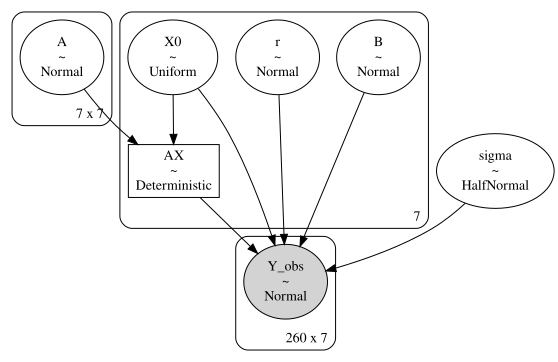

In [ ]:
pm.model_to_graphviz(model=model)


In [ ]:
dinner_smooth.describe()

,time,KaiA,KaiB,KaiC-P,SasA,DNA,RpaA,RpaA-P
count,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000
mean,67.384231,53.415477,51.320858,57.709163,41.645715,26.450273,11.434646,22.483045
std,18.802597,1.675652,2.770936,6.564216,3.005051,2.313195,0.377396,10.342062
min,35.005000,50.276000,46.992000,46.777061,35.846000,22.386000,10.619000,5.391678
25%,51.194500,52.084250,48.591000,51.921407,38.974250,24.639500,11.141750,12.362474
50%,67.384000,53.595500,51.420000,57.180871,41.909500,26.248500,11.520500,23.278276
75%,83.574500,54.767250,54.087000,63.792040,44.416500,28.292500,11.656000,32.408002
max,99.764000,56.300000,55.572000,69.030855,46.220000,30.468000,12.544000,37.993652


In [ ]:
# Variable list to give to the sample step parameter
vars_list = list(model.values_to_rvs.keys())[:-1]

# Specify the sampler
sampler = "Slice Sampler"
tune = draws = 100

# Inference!
with model:
    nuts_trace_slice = pm.sample(progressbar = False)

nuts_trace = nuts_trace_slice
az_nuts_trace = az.summary(nuts_trace)
az_nuts_trace

/usr/lib/python3.11/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Excess accuracy requested (tolerances too small). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
/usr/lib/python3.11/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Excess accuracy requested (tolerances too small). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
/usr/local/lib/python3.11/dist-packages/scipy/inte

ParallelSamplingError: Chain 2 failed with: Bad initial energy: SamplerWarning(kind=<WarningType.BAD_ENERGY: 8>, message='Bad initial energy, check any log probabilities that are inf or -inf, nan or very small:\n[nan nan]\n.Try model.debug() to identify parametrization problems.', level='critical', step=0, exec_info=None, extra=None, divergence_point_source=None, divergence_point_dest=None, divergence_info=None)

## Evaluate Performance

## Get Posterior Params

In [ ]:
A_mh = az_trace.loc[az_trace['mean'].index.str.startswith('A['), 'mean'].values.reshape((n, n))
X0_mh = az_trace.loc[az_trace['mean'].index.str.startswith('X0'), 'mean'].values
r_mh = az_trace.loc[az_trace['mean'].index.str.startswith('r'), 'mean'].values
B_mh = az_trace.loc[az_trace['mean'].index.str.startswith('B'), 'mean'].values

A_mh_df = pd.DataFrame(A_mh,
                       columns = dinner_smooth.columns[1:],
                       index = dinner_smooth.columns[1:])
A_mh_df

,KaiA,KaiB,KaiC-P,SasA,DNA,RpaA,RpaA-P
KaiA,2.808,1.964,-7.357,3.936,-2.835,0.436,0.071
KaiB,1.964,7.678,-10.311,6.362,-0.530,0.630,11.647
KaiC-P,-7.357,-10.311,43.089,-16.135,2.103,-1.078,6.748
SasA,3.936,6.362,-16.135,9.030,-1.768,0.632,1.516
DNA,-2.835,-0.530,2.103,-1.768,5.351,-0.643,-4.597
RpaA,0.436,0.630,-1.078,0.632,-0.643,0.142,1.013
RpaA-P,0.071,11.647,6.748,1.516,-4.597,1.013,106.958


In [ ]:
traj_mh = odeint(func=gLV, y0=X0_mh,
                  t=dinner_smooth.time,
                  args=(r_mh, A_mh @ X0_mh, B_mh))

bayesian_glv_pred_df = pd.DataFrame(traj_mh, columns = dinner_smooth.columns[1:])
bayesian_glv_pred_df

/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Illegal input detected (internal error). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
/usr/local/lib/python3.11/dist-packages/pandas/core/nanops.py:1016: RuntimeWarning: overflow encountered in square
  sqr = _ensure_numeric((avg - values) ** 2)


,KaiA,KaiB,KaiC-P,SasA,DNA,RpaA,RpaA-P
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,6.013659e-154,4.009791e+87,2.326374e+55,2.990638e-67,4.563352e-72,6.530161e-43,1.959945e-62
3,3.654821e-86,2.404612e-57,3.242457e-86,4.136938e+199,2.907374e-33,1.033709e-47,3.669179e-62
4,3.671996e-62,5.148676e-62,1.659150e-76,3.533548e-57,1.191169e-90,9.506375e-43,9.734812e-72
...,...,...,...,...,...,...,...
255,2.121996e-314,NaN,NaN,2.121996e-314,1.050388e-314,NaN,NaN
256,NaN,NaN,2.121996e-314,3.132898e-317,NaN,4.273668e-321,6.735716e-310
257,9.730655e-315,NaN,NaN,NaN,6.953356e-310,9.516206e-315,NaN
258,NaN,NaN,NaN,2.121996e-314,1.050388e-314,NaN,NaN


## Recreate Trajectories & Compare (Plot Predictions)

In [ ]:
dinner_smooth.loc[:, colname].values.shape

(260,)

<ipython-input-122-bb7fdec925b1>:41: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, 'bglv_cyano_w_kaic_traj_noraml.png'))
<ipython-input-122-bb7fdec925b1>:41: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, 'bglv_cyano_w_kaic_traj_noraml.png'))
<ipython-input-122-bb7fdec925b1>:41: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, 'bglv_cyano_w_kaic_traj_noraml.png'))
<ipython-input-122-bb7fdec925b1>:41: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inch

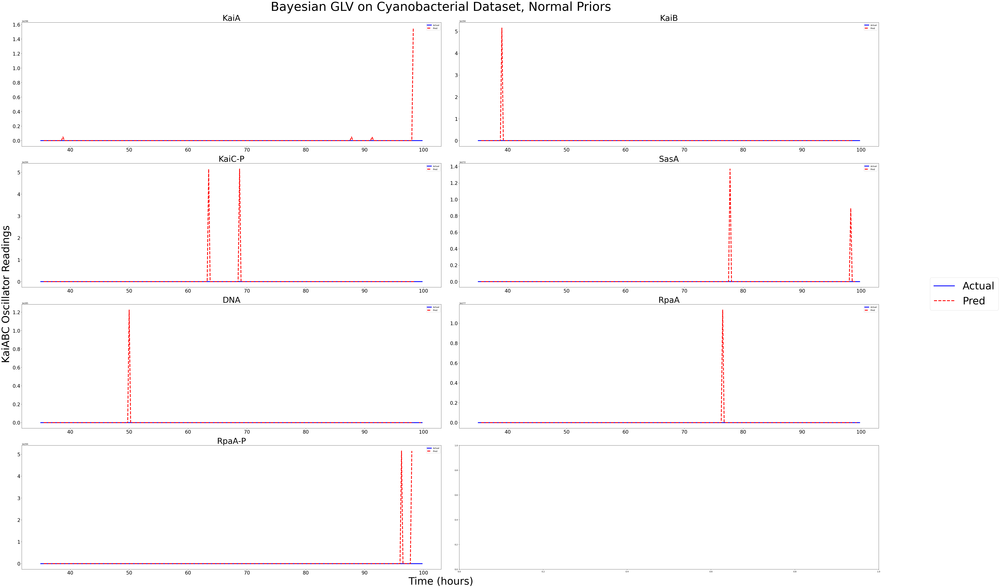

In [ ]:
fig, axs = plt.subplots(4, 2,
                        figsize=(60, 40),
                        layout = "constrained")

gene_cols = dinner_smooth.iloc[:, 1:].columns.tolist()
time_vec_mh = dinner_smooth['time'].values

for col in range(bayesian_glv_pred_df.shape[1]):
  r, c = divmod(col, 2)

  colname = gene_cols[col]

  dinner_smooth.loc[:, colname].values

  axs[r, c].plot(time_vec_mh,
                 dinner_smooth.loc[:, colname].values,
                 '-',
                 color='b',
                 label='Actual',
                 linewidth=4.0)
  axs[r, c].plot(time_vec_mh,
                 bayesian_glv_pred_df.loc[:, colname].values,
                 '--r',
                 label='Pred',
                 linewidth=4.0)
  axs[r, c].legend()
  axs[r, c].set_title(colname, fontsize = 40)
  axs[r, c].tick_params(axis='both', which='major', labelsize=24)
  axs[r, c].tick_params(axis='both', which='minor', labelsize=20)


# Plot
handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, bbox_to_anchor=(1.05, 0.5), loc='center left', fontsize= 50)

fig.supxlabel('Time (hours)', fontsize = 50)
fig.supylabel('KaiABC Oscillator Readings', fontsize = 50)

suptitle_bglv = 'Bayesian GLV on Cyanobacterial Dataset, Normal Priors'
plt.suptitle(suptitle_bglv, fontsize = 60)
plt.savefig(os.path.join(plots_cyano_path, 'bglv_cyano_w_kaic_traj_noraml.png'))
plt.show()

## Interaction Matrix Posterior Heatmap

In [ ]:

plt.figure(figsize=(16,16))
sns.heatmap(A_mh_df, cmap = 'Blues', annot = True, xticklabels=True, yticklabels=True)
plt.title('Bayesian Lotka-Volterra on Cyanobacterial Dataset, Normal Priors')
plt.savefig(os.path.join(plots_cyano_path, "bayes_glv_cyano_w_kaic_normal.png"))


NameError: name 'plt' is not defined

### Interaction Matrix Prior - Gene Covariance Matrix Heatmap

To benchmark how much $A$ changes in the posterior

<AxesSubplot:>

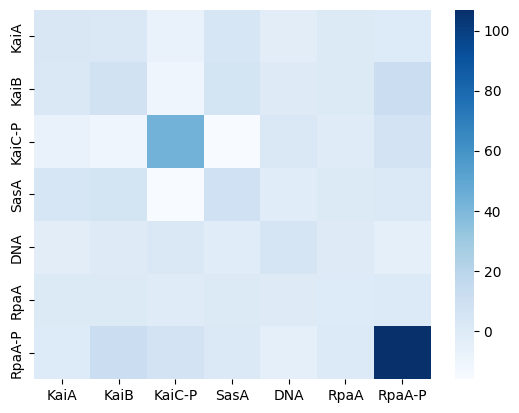

In [ ]:

sns.heatmap(dinner_smooth.iloc[:, 1:].cov(),
            cmap = 'Blues',
            xticklabels=True,
            yticklabels=True)


## Performance Metrics

### Pooled MSE

In [ ]:
bayes_glv_pooled_mse = pooled_mse(true_df = dinner_smooth.iloc[:, 1:], pred_df = bayesian_glv_pred_df)
notnull_idx = bayesian_glv_pred_df.index[bayesian_glv_pred_df.isnull().sum(axis=1) == 0]
bayesian_glv_pred_df.iloc[notnull_idx]

In [ ]:
bayes_glv_r2 = r2_score(y_true = dinner_smooth.iloc[notnull_idx, 1:] // 10000, y_pred = bayesian_glv_pred_df.iloc[notnull_idx] // 10000)

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_regression.py:927: RuntimeWarning: overflow encountered in square
  numerator = (weight * (y_true - y_pred) ** 2).sum(axis=0, dtype=np.float64)


In [ ]:
bayes_glv_A_normed = pd.DataFrame(A_mh / np.linalg.norm(A_mh),
                                  index = dinner_smooth.iloc[:, 1:].columns.tolist(),
                                  columns = dinner_smooth.iloc[:, 1:].columns.tolist())

bglv_coupling = compare_coupling(pred_df = bayes_glv_A_normed,
                                 true_df = true_adjacency)

In [ ]:
print(f"Pooled MSE: {bayes_glv_pooled_mse}")
print(f"R2: {bayes_glv_r2}")
print(f"Coupling Degree: {bglv_coupling}")

Pooled MSE: inf
R2: 0.0
Coupling Degree: 8.888194417315589


# Least Squares GLV

In [ ]:
A_init = dinner_smooth.iloc[:, 1:].cov().values
X0_init = dinner_smooth.iloc[1, 1:].values
r_init = dinner_smooth.iloc[:10, 1:].mean(axis=0)

n = r_init.shape[0]

In [ ]:
def unflatten_theta(theta):
    n = dinner_smooth.shape[1] - 1

    X0 = theta[:n]
    r = theta[n: 2 * n]
    A = theta[2 * n:].reshape((n, n))

    return X0, r, A

def flatten_theta(X0, r, A):
    theta = np.concatenate([X0, r, A.reshape(-1)])

    return theta

def ode_model_resid(theta):

  X0, r, A = unflatten_theta(theta)
  return (
        dinner_smooth.iloc[:, 1:] - odeint(func=gLV,
                                           y0=X0,
                                           t=dinner_smooth.time, args=(r, A))
  ).values.flatten()

In [ ]:
theta = flatten_theta(X0_init, r_init, A_init)

In [ ]:
theta

array([ 5.16810000e+01,  5.54860000e+01,  5.26776595e+01,  4.27670000e+01,
        2.93610000e+01,  1.16230000e+01,  1.61378967e+01,  5.16748000e+01,
        5.49828000e+01,  5.34700841e+01,  4.19912000e+01,  2.90360000e+01,
        1.16281000e+01,  2.00814255e+01,  2.80781113e+00,  1.96418940e+00,
       -7.35722725e+00,  3.93598056e+00, -2.83512492e+00,  4.36037084e-01,
        7.11972097e-02,  1.96418940e+00,  7.67808453e+00, -1.03110381e+01,
        6.36246974e+00, -5.29770891e-01,  6.29723046e-01,  1.16468000e+01,
       -7.35722725e+00, -1.03110381e+01,  4.30889316e+01, -1.61346177e+01,
        2.10299475e+00, -1.07807148e+00,  6.74783396e+00,  3.93598056e+00,
        6.36246974e+00, -1.61346177e+01,  9.03033271e+00, -1.76833305e+00,
        6.31577791e-01,  1.51556660e+00, -2.83512492e+00, -5.29770891e-01,
        2.10299475e+00, -1.76833305e+00,  5.35086888e+00, -6.42701339e-01,
       -4.59703438e+00,  4.36037084e-01,  6.29723046e-01, -1.07807148e+00,
        6.31577791e-01, -

In [ ]:
# decorator with input and output types a Pytensor double float tensors
@as_op(itypes=[pt.dmatrix], otypes=[pt.dmatrix])

def pytensor_forward_model_matrix(theta):

    X0 = theta[:n]
    r = theta[n: 2 * n]
    A = theta[2 * n:].reshape((n, n))

    return odeint(func=gLV, y0=X0,
                  t=dinner_smooth.time,
                  args=(r, A))



def gLV(X, t, r, A):
    return X * (r + A @ X)

In [ ]:
results = least_squares(ode_model_resid, x0=theta)


/usr/local/lib/python3.11/dist-packages/scipy/integrate/_odepack_py.py:248: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
/usr/local/lib/python3.11/dist-packages/scipy/optimize/_numdiff.py:598: RuntimeWarning: overflow encountered in divide
  J_transposed[i] = df / dx


ValueError: array must not contain infs or NaNs

# Summary Results Across Methods

<ipython-input-79-028e6067790e>:57: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "orientation" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, 'cyano_all_w_kaic_small.png'))
<ipython-input-79-028e6067790e>:57: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "facecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, 'cyano_all_w_kaic_small.png'))
<ipython-input-79-028e6067790e>:57: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "edgecolor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig(os.path.join(plots_cyano_path, 'cyano_all_w_kaic_small.png'))
<ipython-input-79-028e6067790e>:57: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_inches_restore" which is no l

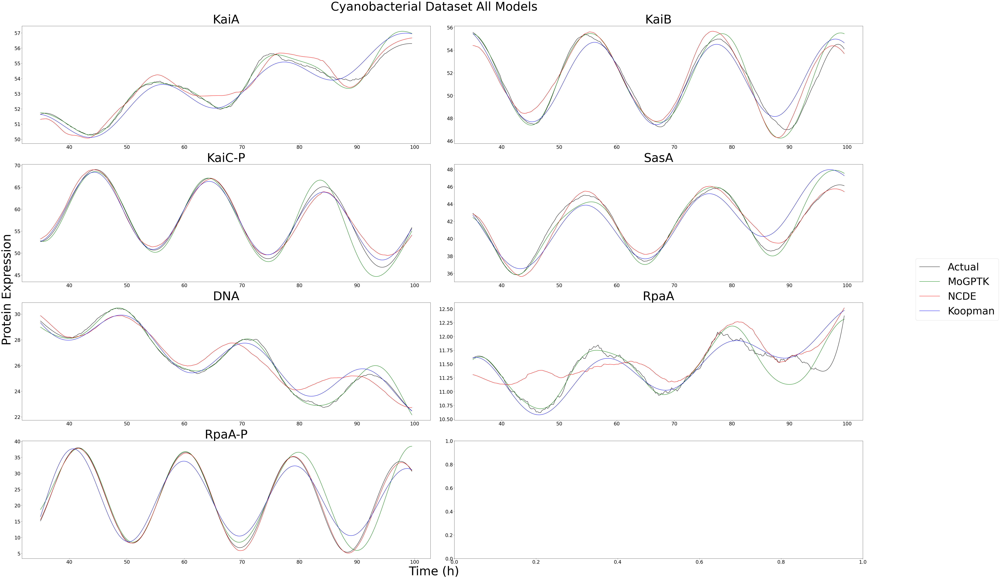

In [ ]:
fig, axs = plt.subplots(4, 2, figsize = (60, 40), layout = "constrained")

gene_cols = dinner_smooth.iloc[:, 1:].columns.tolist()

for col in range(ncde_pred_df.shape[1]):
  r, c = divmod(col, 2)

  colname = gene_cols[col]

  if colname is None:
    continue

  axs[r, c].plot(time_vec[:-1],
                 dinner_smooth.iloc[:-1, :].loc[:, colname].values,
                 '-',
                 color='0',
                 label='Actual')

  axs[r, c].plot(time_vec[:-1],
                 mogptk_preds_df.iloc[:-1, :].loc[:, colname].values,
                 'g',
                 label='MoGPTK')

  axs[r, c].plot(time_vec[:-1],
                ncde_pred_df.loc[:, colname].values,
                label = 'NCDE',
                color='r')

  axs[r, c].plot(time_vec[:-1],
                 koopman_pred_df.iloc[:-1, :].loc[:, colname].values,
                 label='Koopman',
                 color='b')

  # axs[r, c].plot(time_vec[:-1],
  #                bayesian_glv_pred_df.iloc[:-1, :].loc[:, colname].values,
  #                label='Bayes GLV',
  #                color='c')

  axs[r, c].set_title(colname, fontsize = 60)


fig.supxlabel('Time (h)', fontsize = 60)
fig.supylabel('Protein Expression', fontsize = 60)

for a in axs.flatten():
    a.tick_params(axis='both', which='major', labelsize=24)
    a.tick_params(axis='both', which='minor', labelsize=20)

# Get handles and labels from one of the subplots
handles, labels = axs[0, 0].get_legend_handles_labels()

fig.legend(handles, labels, bbox_to_anchor=(1.05, 0.5), ncol = 1,
           loc='center left', fontsize = 50)

suptitle_all = 'Cyanobacterial Dataset All Models'
plt.suptitle(suptitle_all, fontsize = 60)
plt.savefig(os.path.join(plots_cyano_path, 'cyano_all_w_kaic_small.png'))
plt.show()

# Appendix

## Kuramoto Estimator

In [ ]:
dtheta_dt_data

array([[ 0.13998054,  0.11598388,  0.06999027, ...,  0.00599917,
        -0.01199833, -0.01999722],
       [-0.34395219, -0.38194691, -0.4539369 , ..., -0.61391467,
        -0.82388548, -0.93187047],
       [ 0.1938306 ,  0.30178307,  0.51609199, ...,  2.65210146,
         2.63838318,  2.62720868],
       ...,
       [-0.40394385, -0.39994441, -0.39194552, ..., -0.41594219,
        -0.38394663, -0.36794886],
       [ 0.07198999,  0.06199138,  0.03999444, ...,  0.58191912,
         0.64191078,  0.67190661],
       [ 3.93675759,  4.04726626,  4.25329329, ..., -2.69407847,
        -3.03177001, -3.19567254]])

In [ ]:
from scipy.optimize import minimize

# Load the synthetic dataset
data = dinner_smooth
time = data['time'].values
phases = data.drop(columns='time').values.T  # shape: (N, time_points)
N = data.shape[1] - 1  # number of oscillators

# Compute phase derivatives (finite difference)
dt = np.mean(np.diff(time))
dtheta_dt_data = np.gradient(phases, dt, axis=1)

# Estimate natural frequencies as mean derivative over time
omega_est = np.mean(dtheta_dt_data, axis=1)

# Define Kuramoto model residuals function
def kuramoto_residual(K, theta, dtheta_dt, omega, N):
    residuals = []
    for i in range(N):
        coupling_sum = np.sum(np.sin(theta - theta[i, :]), axis=0)
        dtheta_dt_model = omega[i] + (K / N) * coupling_sum
        residuals.append(dtheta_dt[i, :] - dtheta_dt_model)
    return np.ravel(residuals)

# Loss function to minimize (mean squared error)
def loss(K):
    res = kuramoto_residual(K, phases, dtheta_dt_data, omega_est, N)
    return np.mean(np.square(res))

# Initial guess for K and optimization
result = minimize(loss, x0=[0.1], bounds=[(0, 2.0)])
K_fit = result.x[0]

K_fit


0.0

In [ ]:
import numpy as np
from scipy.integrate import solve_ivp
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# --- 1. Kuramoto Model Definition ---
def kuramoto_ode(t, theta, omega, K, N):
    """Kuramoto model ODE system."""
    # theta is a vector of phases [theta_1, theta_2, ..., theta_N]
    dtheta_dt = np.zeros_like(theta)
    for i in range(N):
        sync_term = 0.0
        for j in range(N):
            # Use np.sin for efficient vectorized calculation if possible,
            # but direct loop is clearer here for the formula.
            sync_term += np.sin(theta[j] - theta[i])
        dtheta_dt[i] = omega[i] + (K / N) * sync_term
    return dtheta_dt

# --- Helper function for phase difference (handles wrapping) ---
def phase_difference(phase1, phase2):
    """Calculates the shortest difference between two phases."""
    diff = phase1 - phase2
    return np.arctan2(np.sin(diff), np.cos(diff))

# --- 2. Objective Function ---
def objective_function(params, t_eval, observed_phases, initial_phases, omega, N):
    """
    Calculates the error between model prediction and observed phases.
    'params' contains the parameter(s) to fit (here, just K).
    'observed_phases' has shape (num_timepoints, N)
    """
    K = params[0] # Extract K from parameters list

    # Ensure K is non-negative (often biologically plausible)
    if K < 0:
        return 1e10 # Return a large error if K is negative

    # Simulate the Kuramoto model
    sol = solve_ivp(
        kuramoto_ode,
        (t_eval[0], t_eval[-1]),
        initial_phases,
        args=(omega, K, N),
        t_eval=t_eval,
        method='RK45' # Or another suitable solver
    )

    if sol.status != 0:
        # Penalize if integration fails
        print(f"Warning: ODE solver failed for K={K}")
        return 1e10

    simulated_phases = sol.y.T # Transpose to get shape (num_timepoints, N)

    # Calculate error - Sum of squared phase differences
    # Use the helper function to handle phase wrapping correctly
    error = np.sum(phase_difference(simulated_phases, observed_phases)**2)

    # Alternative error: Error based on sin/cos differences
    # error = np.sum((np.cos(simulated_phases) - np.cos(observed_phases))**2 +
    #                (np.sin(simulated_phases) - np.sin(observed_phases))**2)

    # print(f"Trying K={K:.4f}, Error={error:.4f}") # Optional: for debugging
    return error

# --- 3. Generate Synthetic Data (or Load Real Data) ---
# For demonstration, let's generate synthetic data

# Parameters for synthetic data generation
N_oscillators = dinner_smooth.shape[1] - 1
true_K = 1.5 # The coupling strength we want to recover
period = 24.0 # Approximate period in hours
base_omega = 2 * np.pi / period

# Assign slightly different natural frequencies (e.g., normally distributed around base_omega)
np.random.seed(42)
natural_omegas = np.random.normal(loc=base_omega, scale=0.05, size=N_oscillators)

# Simulation time
t_span = (dinner_smooth.time.values[0], dinner_smooth.time.values[-1])
t_eval = dinner_smooth.time.values
# t_span = (0, 10 * period) # Simulate for 10 cycles
# t_eval = np.linspace(t_span[0], t_span[1], 500) # Time points for evaluation

# Initial phases (randomly distributed)
initial_phases_true = np.random.uniform(0, 2 * np.pi, size=N_oscillators)

# Simulate the "true" system to get our "observed" data
sol_true = solve_ivp(
    kuramoto_ode,
    t_span,
    initial_phases_true,
    args=(natural_omegas, true_K, N_oscillators),
    t_eval=t_eval,
    dense_output=True
)

# --- !! IMPORTANT !! ---
# Extract the phases. In a real scenario, this `observed_phases_data`
# would come from your phase estimation step (Hilbert, Wavelet, etc.)
# applied to your raw circadian time-series data.
observed_phases_data = dinner_smooth.iloc[:, 1:].values # sol_true.y.T # Shape: (num_timepoints, N)
initial_phases_observed = dinner_smooth.iloc[1, 1:].values # Use the first time point as initial condition for fitting

# Optional: Add some noise to make it more realistic (uncomment to use)
# noise_level = 0.1 # Radians
# observed_phases_data += np.random.normal(0, noise_level, observed_phases_data.shape)
# observed_phases_data = np.mod(observed_phases_data, 2 * np.pi) # Wrap phase to [0, 2*pi]
# initial_phases_observed = observed_phases_data[0, :]

# --- 4. Optimization ---
# Initial guess for K
initial_guess = [1.0] # Guess K=1.0
# Bounds for K (e.g., K >= 0)
bounds = [(0, None)] # K must be non-negative

print(f"Starting optimization to find K...")
result = minimize(
    objective_function,
    initial_guess,
    args=(t_eval, observed_phases_data, initial_phases_observed, natural_omegas, N_oscillators),
    method='L-BFGS-B', # Method that supports bounds
    # method='Nelder-Mead', # Simpler method, doesn't use bounds directly but might work
    bounds=bounds,
    options={'disp': True, 'ftol': 1e-8} # Display progress, set tolerance
)

# --- 5. Results and Evaluation ---
if result.success:
    fitted_K = result.x[0]
    print(f"\nOptimization Successful!")
    print(f"True K = {true_K}")
    print(f"Fitted K = {fitted_K:.4f}")

    # Simulate model with fitted K
    sol_fitted = solve_ivp(
        kuramoto_ode,
        (t_eval[0], t_eval[-1]),
        initial_phases_observed,
        args=(natural_omegas, fitted_K, N_oscillators),
        t_eval=t_eval,
    )
    fitted_phases = sol_fitted.y.T

    # --- Plotting ---
    plt.figure(figsize=(12, 8))

    # Plot 1: Observed vs Fitted Phases (modulo 2pi)
    plt.subplot(2, 1, 1)
    for i in range(N_oscillators):
        # Plot observed phases (use points or dashed lines)
        plt.plot(t_eval / period, np.mod(observed_phases_data[:, i], 2 * np.pi), '--', label=f'Observed Osc {i+1}' if i==0 else None, color=f'C{i}')
        # Plot fitted phases (use solid lines)
        plt.plot(t_eval / period, np.mod(fitted_phases[:, i], 2 * np.pi), '-', label=f'Fitted Osc {i+1}' if i==0 else None, color=f'C{i}')

    plt.title(f'Observed vs. Fitted Kuramoto Model (Fitted K = {fitted_K:.3f})')
    plt.xlabel('Time (cycles)')
    plt.ylabel('Phase (radians mod 2pi)')
    plt.legend(loc='upper left', bbox_to_anchor=(1,1))
    plt.grid(True)

    # Plot 2: Phase Differences (relative to the mean phase)
    plt.subplot(2, 1, 2)
    mean_phase_obs = np.arctan2(np.mean(np.sin(observed_phases_data), axis=1), np.mean(np.cos(observed_phases_data), axis=1))
    mean_phase_fit = np.arctan2(np.mean(np.sin(fitted_phases), axis=1), np.mean(np.cos(fitted_phases), axis=1))

    for i in range(N_oscillators):
         # Plot observed phase differences (use points or dashed lines)
        plt.plot(t_eval / period, phase_difference(observed_phases_data[:, i], mean_phase_obs), '--', label=f'Observed Osc {i+1}' if i==0 else None, color=f'C{i}')
         # Plot fitted phase differences (use solid lines)
        plt.plot(t_eval / period, phase_difference(fitted_phases[:, i], mean_phase_fit), '-', label=f'Fitted Osc {i+1}' if i==0 else None, color=f'C{i}')

    plt.title('Phase Differences Relative to Mean Phase')
    plt.xlabel('Time (cycles)')
    plt.ylabel('Relative Phase (radians)')
    plt.ylim(-np.pi, np.pi)
    plt.legend(loc='upper left', bbox_to_anchor=(1,1))
    plt.grid(True)

    plt.tight_layout()
    plt.show()

else:
    print("\nOptimization Failed:")
    print(result.message)

Starting optimization to find K...

Optimization Failed:
ABNORMAL_TERMINATION_IN_LNSRCH


## NCDE Trial Runs

### NCDE Run: 4/13/2025 6:35 PM, 500 steps

Finished control with CubicInterpolation(
  ts=f32[166], coeffs=[f32[165,31], f32[165,31], f32[165,31], f32[165,31]]
)
ts[0] shape: ()
y0 shape: (16,)
y_true: (32, 166, 30); y_pred: (32, 166, 30).
Step: 0, Loss: 3595.550537109375, Accuracy: 3595.550537109375, Computation time: 21.925617933273315
Step: 1, Loss: 3555.825927734375, Accuracy: 3555.825927734375, Computation time: 1.09849214553833
Step: 2, Loss: 3507.551025390625, Accuracy: 3507.551025390625, Computation time: 1.6345157623291016
Step: 3, Loss: 3487.687255859375, Accuracy: 3487.687255859375, Computation time: 0.76163649559021
Step: 4, Loss: 3472.209228515625, Accuracy: 3472.209228515625, Computation time: 0.6960725784301758
Step: 5, Loss: 3440.94921875, Accuracy: 3440.94921875, Computation time: 0.8357787132263184
Step: 6, Loss: 3413.404296875, Accuracy: 3413.404296875, Computation time: 0.8866899013519287
Step: 7, Loss: 3391.3505859375, Accuracy: 3391.3505859375, Computation time: 1.196861982345581
Step: 8, Loss: 3376.815917

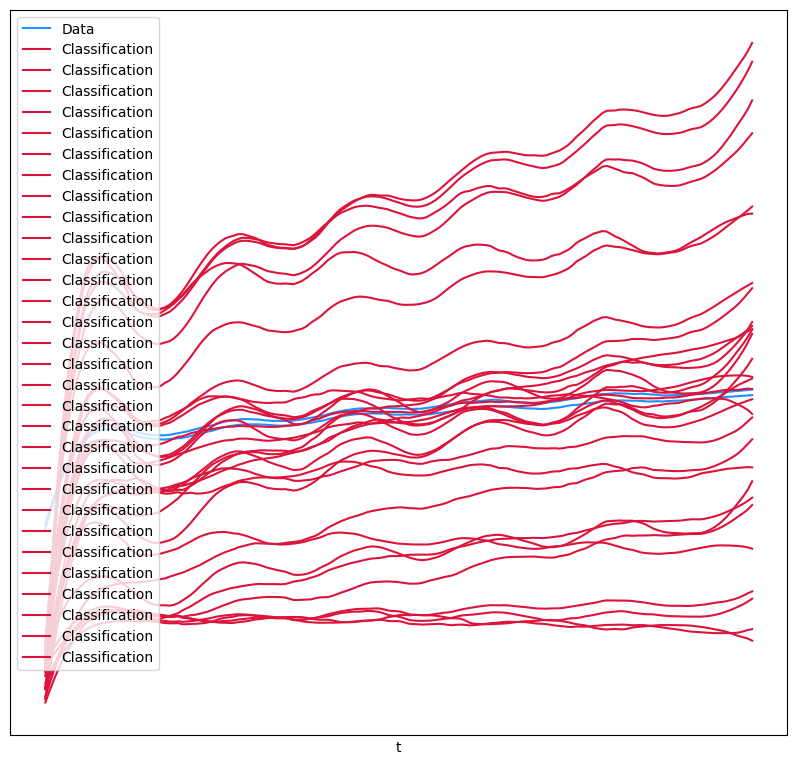

In [ ]:
# Training loop like normal.
### Model Instantiation ###
# NeuralCDEV2 is a class that takes in an (N, T - 1, G) tensor and the network architecture params.
# When instantiated (as done below)
model_sim = NeuralCDE(data_size = X_waveforms.shape[-1],
                      hidden_size = HIDDEN_SIZE,
                      width_size = WIDTH_SIZE,
                      output_size = OUTPUT_SIZE,
                      depth = DEPTH,
                      key = model_key)

### FUNCTIONS ###
def ncde_predict(model, ti, coeff_i, evolving_out = False):
    if evolving_out:
        def model_evolving(ts, coeffs):
            return model(ts, coeffs, evolving_out = True)
        return jax.vmap(model_evolving)(ti, coeff_i)
    else:
        return jax.vmap(model)(ti, coeff_i)

def compute_mse(y_true, y_pred, epsilon=1e-15):
    """
    MSE Loss for forecasting with real numbers
    """
    # if y_true.ndim == 3:
    #     y_true = y_true[:, 0, :]

    # Ensure predictions are clipped to avoid log(0)
    # y_pred = jnp.clip(y_pred, epsilon, 1 - epsilon)

    # Calculate the categorical cross-entropy
    # loss = jnp.mean(optax.l2_loss(y_pred, y_true))
    loss = jnp.mean((y_true - y_pred)**2, axis=1)

    # Return the mean loss over all samples
    return jnp.mean(loss)

@eqx.filter_jit
def loss(model, ti, y_true, coeff_i, evolving_out = False):
    pred = ncde_predict(model, ti, coeff_i, evolving_out = evolving_out)

    print(f"y_true: {y_true.shape}; y_pred: {pred.shape}.")

    # MSE
    mse_val = compute_mse(y_true = y_true, y_pred = pred)

    # mse_val = jnp.mean(mse_val)

    return mse_val, mse_val

# has_aux true will return two values: output to be differentiated and its gradient
grad_loss = eqx.filter_value_and_grad(loss, has_aux=True)

@eqx.filter_jit
def make_step(model, data_i, opt_state):
    ti, label_i, label_all_i, *coeff_i = data_i

    (mse_val, _), grads = grad_loss(model, ti, label_all_i, coeff_i, evolving_out = True)
    updates, opt_state = optim.update(grads, opt_state)
    model = eqx.apply_updates(model, updates)
    return mse_val, model, opt_state

# Data Processing Functions
def dataloader(arrays, batch_size, *, key):
    dataset_size = arrays[0].shape[0]
    assert all(array.shape[0] == dataset_size for array in arrays)
    indices = jnp.arange(dataset_size)
    while True:
        perm = jr.permutation(key, indices)
        (key,) = jr.split(key, 1)
        start = 0
        end = batch_size
        while end < dataset_size:
            batch_perm = perm[start:end]
            yield tuple(array[batch_perm] for array in arrays)
            start = end
            end = start + batch_size


### EXECUTION ###
# Optional section
optim = optax.adam(1e-4)
opt_state = optim.init(eqx.filter(model_sim, eqx.is_inexact_array))
for step, data_i in zip(
    range(steps), dataloader((t_mat2d, y_waveforms, y_waveforms_evol) + coeffs, BATCH_SIZE, key=loader_key)
):
    start = time.time()
    mse_val, model_sim, opt_state = make_step(model_sim, data_i, opt_state)
    end = time.time()
    print(
        f"Step: {step}, Loss: {mse_val}, Accuracy: {mse_val}, Computation time: "
        f"{end - start}"
    )

# ts, coeffs, labels, _ = get_data(dataset_size, add_noise, key=test_data_key)
(mse_val, _) = loss(model = model_sim,
                    ti = t_mat2d,
                    y_true = y_waveforms,
                    coeff_i = coeffs)
print(f"Test loss: {mse_val}, Test Accuracy: {mse_val}")

# Plot results : Data Preparation for Plotting
sample_ts = t_mat2d[-1] # gets the last waveform in the dataset [size: (N_TIMEPOINTS - 1,)]
# coeffs is a list of four tensors for each cubic spliene coefficient,
# so we get, for each coefficient tensor, the last row which is the coefficients of the last tensor
sample_coeffs = tuple(c[-1] for c in coeffs)
# Get predictions for that waveform
pred = model_sim(sample_ts, sample_coeffs, evolving_out=True)
# This interpolates data for the coefficients
interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# Evaluates sample time series for the actual values
values = jax.vmap(interp.evaluate)(sample_ts)

# Plot 1
fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1)

ax1.plot(sample_ts, values[:, 1], c="dodgerblue")
ax1.plot(sample_ts, values[:, 2], c="dodgerblue", label="Data")
ax1.plot(sample_ts, pred, c="crimson", label="Classification")
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xlabel("t")
ax1.legend()

# Plot 2
# ax2 = fig.add_subplot(1, 2, 2, projection="3d")
# ax2.plot(values[:, 1], values[:, 2], c="dodgerblue", label="Data")
# ax2.plot(values[:, 1], values[:, 2], pred[:, 1], c="crimson", label="Classification")
# ax2.set_xticks([])
# ax2.set_yticks([])
# ax2.set_zticks([])
# ax2.set_xlabel("x")
# ax2.set_ylabel("y")
# ax2.set_zlabel("Classification")
plt.tight_layout()
plt.savefig("neural_cde.png")
plt.show()

### NCDE Run: 4/13/2025 6:25PM, 200 steps

Finished control with CubicInterpolation(
  ts=f32[166], coeffs=[f32[165,31], f32[165,31], f32[165,31], f32[165,31]]
)
ts[0] shape: ()
y0 shape: (16,)
y_true: (32, 166, 30); y_pred: (32, 166, 30).
Step: 0, Loss: 3595.26220703125, Accuracy: 3595.26220703125, Computation time: 26.537452697753906
Step: 1, Loss: 3555.12841796875, Accuracy: 3555.12841796875, Computation time: 0.9068377017974854
Step: 2, Loss: 3507.05810546875, Accuracy: 3507.05810546875, Computation time: 0.8603711128234863
Step: 3, Loss: 3488.76220703125, Accuracy: 3488.76220703125, Computation time: 0.7739553451538086
Step: 4, Loss: 3471.976318359375, Accuracy: 3471.976318359375, Computation time: 0.7465741634368896
Step: 5, Loss: 3441.75390625, Accuracy: 3441.75390625, Computation time: 0.8720881938934326
Step: 6, Loss: 3413.742919921875, Accuracy: 3413.742919921875, Computation time: 1.4321730136871338
Step: 7, Loss: 3391.753662109375, Accuracy: 3391.753662109375, Computation time: 2.754321813583374
Step: 8, Loss: 3376.

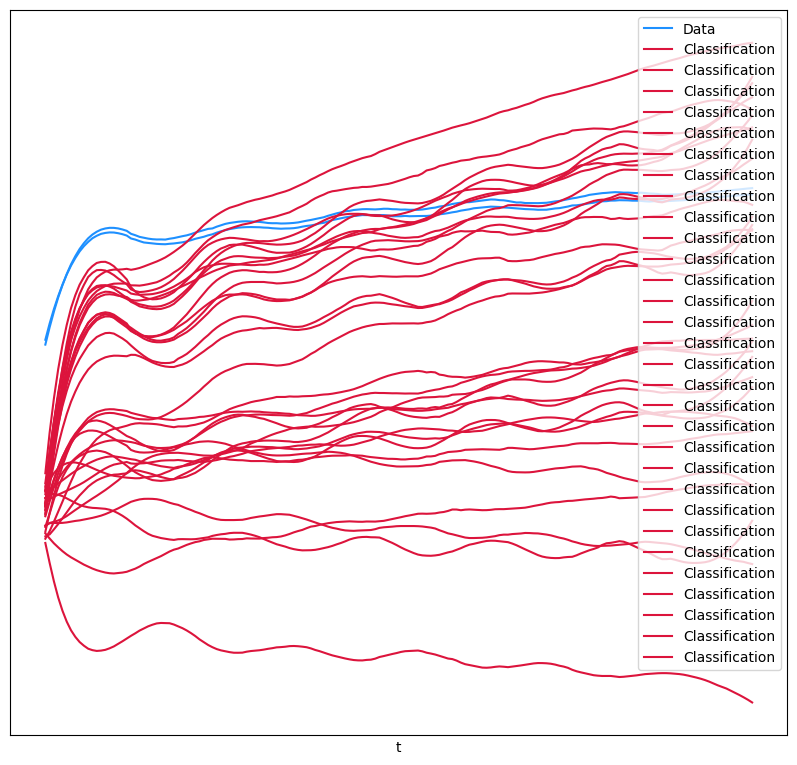

In [ ]:
# Training loop like normal.
### Model Instantiation ###
# NeuralCDEV2 is a class that takes in an (N, T - 1, G) tensor and the network architecture params.
# When instantiated (as done below)
model_sim = NeuralCDE(data_size = X_waveforms.shape[-1],
                      hidden_size = HIDDEN_SIZE,
                      width_size = WIDTH_SIZE,
                      output_size = OUTPUT_SIZE,
                      depth = DEPTH,
                      key = model_key)

### FUNCTIONS ###
def ncde_predict(model, ti, coeff_i, evolving_out = False):
    if evolving_out:
        def model_evolving(ts, coeffs):
            return model(ts, coeffs, evolving_out = True)
        return jax.vmap(model_evolving)(ti, coeff_i)
    else:
        return jax.vmap(model)(ti, coeff_i)

def compute_mse(y_true, y_pred, epsilon=1e-15):
    """
    MSE Loss for forecasting with real numbers
    """
    # if y_true.ndim == 3:
    #     y_true = y_true[:, 0, :]

    # Ensure predictions are clipped to avoid log(0)
    # y_pred = jnp.clip(y_pred, epsilon, 1 - epsilon)

    # Calculate the categorical cross-entropy
    # loss = jnp.mean(optax.l2_loss(y_pred, y_true))
    loss = jnp.mean((y_true - y_pred)**2, axis=1)

    # Return the mean loss over all samples
    return jnp.mean(loss)

@eqx.filter_jit
def loss(model, ti, y_true, coeff_i, evolving_out = False):
    pred = ncde_predict(model, ti, coeff_i, evolving_out = evolving_out)

    print(f"y_true: {y_true.shape}; y_pred: {pred.shape}.")

    # MSE
    mse_val = compute_mse(y_true = y_true, y_pred = pred)

    # mse_val = jnp.mean(mse_val)

    return mse_val, mse_val

# has_aux true will return two values: output to be differentiated and its gradient
grad_loss = eqx.filter_value_and_grad(loss, has_aux=True)

@eqx.filter_jit
def make_step(model, data_i, opt_state):
    ti, label_i, label_all_i, *coeff_i = data_i

    (mse_val, _), grads = grad_loss(model, ti, label_all_i, coeff_i, evolving_out = True)
    updates, opt_state = optim.update(grads, opt_state)
    model = eqx.apply_updates(model, updates)
    return mse_val, model, opt_state

# Data Processing Functions
def dataloader(arrays, batch_size, *, key):
    dataset_size = arrays[0].shape[0]
    assert all(array.shape[0] == dataset_size for array in arrays)
    indices = jnp.arange(dataset_size)
    while True:
        perm = jr.permutation(key, indices)
        (key,) = jr.split(key, 1)
        start = 0
        end = batch_size
        while end < dataset_size:
            batch_perm = perm[start:end]
            yield tuple(array[batch_perm] for array in arrays)
            start = end
            end = start + batch_size


### EXECUTION ###
# Optional section
optim = optax.adam(1e-4)
opt_state = optim.init(eqx.filter(model_sim, eqx.is_inexact_array))
for step, data_i in zip(
    range(steps), dataloader((t_mat2d, y_waveforms, y_waveforms_evol) + coeffs, BATCH_SIZE, key=loader_key)
):
    start = time.time()
    mse_val, model_sim, opt_state = make_step(model_sim, data_i, opt_state)
    end = time.time()
    print(
        f"Step: {step}, Loss: {mse_val}, Accuracy: {mse_val}, Computation time: "
        f"{end - start}"
    )

# ts, coeffs, labels, _ = get_data(dataset_size, add_noise, key=test_data_key)
(mse_val, _) = loss(model = model_sim,
                    ti = t_mat2d,
                    y_true = y_waveforms,
                    coeff_i = coeffs)
print(f"Test loss: {mse_val}, Test Accuracy: {mse_val}")

# Plot results : Data Preparation for Plotting
sample_ts = t_mat2d[-1] # gets the last waveform in the dataset [size: (N_TIMEPOINTS - 1,)]
# coeffs is a list of four tensors for each cubic spliene coefficient,
# so we get, for each coefficient tensor, the last row which is the coefficients of the last tensor
sample_coeffs = tuple(c[-1] for c in coeffs)
# Get predictions for that waveform
pred = model_sim(sample_ts, sample_coeffs, evolving_out=True)
# This interpolates data for the coefficients
interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# Evaluates sample time series for the actual values
values = jax.vmap(interp.evaluate)(sample_ts)

# Plot 1
fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1)

ax1.plot(sample_ts, values[:, 1], c="dodgerblue")
ax1.plot(sample_ts, values[:, 2], c="dodgerblue", label="Data")
ax1.plot(sample_ts, pred, c="crimson", label="Classification")
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xlabel("t")
ax1.legend()

# Plot 2
# ax2 = fig.add_subplot(1, 2, 2, projection="3d")
# ax2.plot(values[:, 1], values[:, 2], c="dodgerblue", label="Data")
# ax2.plot(values[:, 1], values[:, 2], pred[:, 1], c="crimson", label="Classification")
# ax2.set_xticks([])
# ax2.set_yticks([])
# ax2.set_zticks([])
# ax2.set_xlabel("x")
# ax2.set_ylabel("y")
# ax2.set_zlabel("Classification")
plt.tight_layout()
plt.savefig("neural_cde.png")
plt.show()

### NCDE Run: 4/13/2025 6:00PM, 100 steps

Finished control with CubicInterpolation(
  ts=f32[166], coeffs=[f32[165,31], f32[165,31], f32[165,31], f32[165,31]]
)
y_true: (32, 166, 30); y_pred: (32, 166, 30).
Step: 0, Loss: 3595.312744140625, Accuracy: 3595.312744140625, Computation time: 19.95695424079895
Step: 1, Loss: 3555.794921875, Accuracy: 3555.794921875, Computation time: 1.4375996589660645
Step: 2, Loss: 3506.536376953125, Accuracy: 3506.536376953125, Computation time: 1.3460593223571777
Step: 3, Loss: 3487.83447265625, Accuracy: 3487.83447265625, Computation time: 1.1185424327850342
Step: 4, Loss: 3472.236083984375, Accuracy: 3472.236083984375, Computation time: 0.6792178153991699
Step: 5, Loss: 3441.907470703125, Accuracy: 3441.907470703125, Computation time: 0.7658653259277344
Step: 6, Loss: 3413.754150390625, Accuracy: 3413.754150390625, Computation time: 0.8729970455169678
Step: 7, Loss: 3391.171630859375, Accuracy: 3391.171630859375, Computation time: 1.066856861114502
Step: 8, Loss: 3376.109130859375, Accuracy: 3

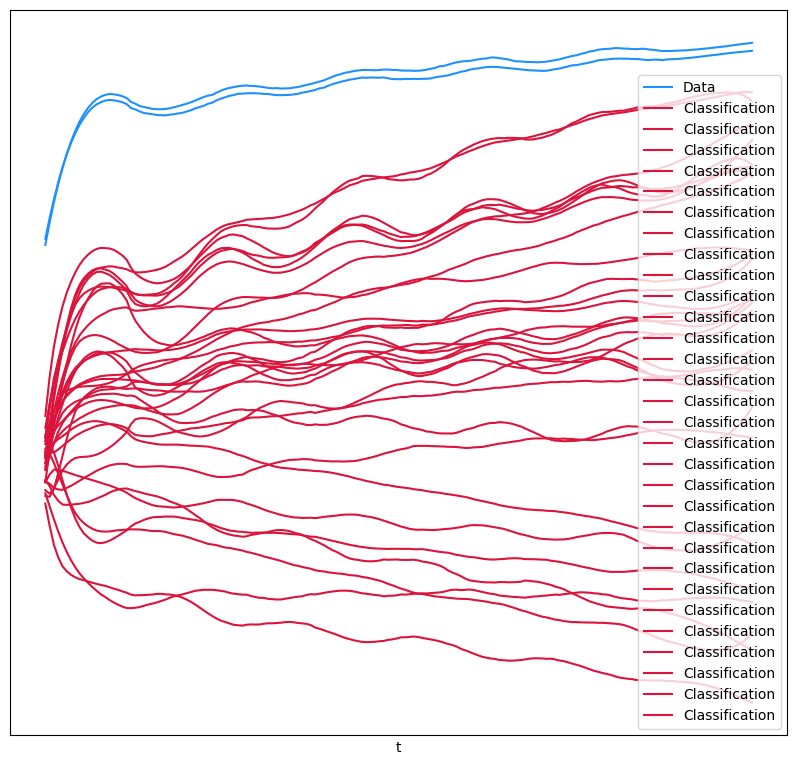

In [ ]:
# Training loop like normal.
### Model Instantiation ###
# NeuralCDEV2 is a class that takes in an (N, T - 1, G) tensor and the network architecture params.
# When instantiated (as done below)
model_sim = NeuralCDE(data_size = X_waveforms.shape[-1],
                      hidden_size = HIDDEN_SIZE,
                      width_size = WIDTH_SIZE,
                      output_size = OUTPUT_SIZE,
                      depth = DEPTH,
                      key = model_key)

### FUNCTIONS ###
def ncde_predict(model, ti, coeff_i, evolving_out = False):
    if evolving_out:
        def model_evolving(ts, coeffs):
            return model(ts, coeffs, evolving_out = True)
        return jax.vmap(model_evolving)(ti, coeff_i)
    else:
        return jax.vmap(model)(ti, coeff_i)

def compute_mse(y_true, y_pred, epsilon=1e-15):
    """
    MSE Loss for forecasting with real numbers
    """
    # if y_true.ndim == 3:
    #     y_true = y_true[:, 0, :]

    # Ensure predictions are clipped to avoid log(0)
    # y_pred = jnp.clip(y_pred, epsilon, 1 - epsilon)

    # Calculate the categorical cross-entropy
    # loss = jnp.mean(optax.l2_loss(y_pred, y_true))
    loss = jnp.mean((y_true - y_pred)**2, axis=1)

    # Return the mean loss over all samples
    return jnp.mean(loss)

@eqx.filter_jit
def loss(model, ti, y_true, coeff_i, evolving_out = False):
    pred = ncde_predict(model, ti, coeff_i, evolving_out = evolving_out)

    print(f"y_true: {y_true.shape}; y_pred: {pred.shape}.")

    # MSE
    mse_val = compute_mse(y_true = y_true, y_pred = pred)

    # mse_val = jnp.mean(mse_val)

    return mse_val, mse_val

# has_aux true will return two values: output to be differentiated and its gradient
grad_loss = eqx.filter_value_and_grad(loss, has_aux=True)

@eqx.filter_jit
def make_step(model, data_i, opt_state):
    ti, label_i, label_all_i, *coeff_i = data_i

    (mse_val, _), grads = grad_loss(model, ti, label_all_i, coeff_i, evolving_out = True)
    updates, opt_state = optim.update(grads, opt_state)
    model = eqx.apply_updates(model, updates)
    return mse_val, model, opt_state

# Data Processing Functions
def dataloader(arrays, batch_size, *, key):
    dataset_size = arrays[0].shape[0]
    assert all(array.shape[0] == dataset_size for array in arrays)
    indices = jnp.arange(dataset_size)
    while True:
        perm = jr.permutation(key, indices)
        (key,) = jr.split(key, 1)
        start = 0
        end = batch_size
        while end < dataset_size:
            batch_perm = perm[start:end]
            yield tuple(array[batch_perm] for array in arrays)
            start = end
            end = start + batch_size


### EXECUTION ###
# Optional section
optim = optax.adam(1e-4)
opt_state = optim.init(eqx.filter(model_sim, eqx.is_inexact_array))
for step, data_i in zip(
    range(steps), dataloader((t_mat2d, y_waveforms, y_waveforms_evol) + coeffs, BATCH_SIZE, key=loader_key)
):
    start = time.time()
    mse_val, model_sim, opt_state = make_step(model_sim, data_i, opt_state)
    end = time.time()
    print(
        f"Step: {step}, Loss: {mse_val}, Accuracy: {mse_val}, Computation time: "
        f"{end - start}"
    )

# ts, coeffs, labels, _ = get_data(dataset_size, add_noise, key=test_data_key)
(mse_val, _) = loss(model = model_sim,
                    ti = t_mat2d,
                    y_true = y_waveforms,
                    coeff_i = coeffs)
print(f"Test loss: {mse_val}, Test Accuracy: {mse_val}")

# Plot results : Data Preparation for Plotting
sample_ts = t_mat2d[-1] # gets the last waveform in the dataset [size: (N_TIMEPOINTS - 1,)]
# coeffs is a list of four tensors for each cubic spliene coefficient,
# so we get, for each coefficient tensor, the last row which is the coefficients of the last tensor
sample_coeffs = tuple(c[-1] for c in coeffs)
# Get predictions for that waveform
pred = model_sim(sample_ts, sample_coeffs, evolving_out=True)
# This interpolates data for the coefficients
interp = diffrax.CubicInterpolation(sample_ts, sample_coeffs)
# Evaluates sample time series for the actual values
values = jax.vmap(interp.evaluate)(sample_ts)

# Plot 1
fig = plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(1, 2, 1)

ax1.plot(sample_ts, values[:, 1], c="dodgerblue")
ax1.plot(sample_ts, values[:, 2], c="dodgerblue", label="Data")
ax1.plot(sample_ts, pred, c="crimson", label="Classification")
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xlabel("t")
ax1.legend()

# Plot 2
# ax2 = fig.add_subplot(1, 2, 2, projection="3d")
# ax2.plot(values[:, 1], values[:, 2], c="dodgerblue", label="Data")
# ax2.plot(values[:, 1], values[:, 2], pred[:, 1], c="crimson", label="Classification")
# ax2.set_xticks([])
# ax2.set_yticks([])
# ax2.set_zticks([])
# ax2.set_xlabel("x")
# ax2.set_ylabel("y")
# ax2.set_zlabel("Classification")
plt.tight_layout()
plt.savefig("neural_cde.png")
plt.show()

## Train-test split